In [1]:
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.patches as patches
import random
from sklearn.utils import shuffle
from tqdm import tqdm_notebook
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from glob import glob
import shutil
import seaborn as sns

import torch
import torchvision.models as models
from torchvision import datasets, transforms, models
from torch import nn, optim
import torch.nn.functional as F
%config InlineBackend.figure_format = 'retina'
from tqdm import tqdm
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
import torch.nn as nn
import torch.nn.functional as F
import random
from termcolor import colored
from sklearn.metrics import confusion_matrix
import itertools
from sklearn.model_selection import train_test_split
from tsne import bh_sne

# 1. Image data EDA and quality control

In [2]:
labels = pd.read_csv('/Volumes/Yuchen_Drive/Histopathologic_Cancer_Detection/train_labels.csv')
print('Total number of images: {}'.format(labels.shape[0]))

Total number of images: 220025


In [3]:
labels.head()

,id,label
0,f38a6374c348f90b587e046aac6079959adf3835,0
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77,1
2,755db6279dae599ebb4d39a9123cce439965282d,0
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08,0
4,068aba587a4950175d04c680d38943fd488d6a9d,0


Text(0.5, 1.0, 'Number of images in each class')

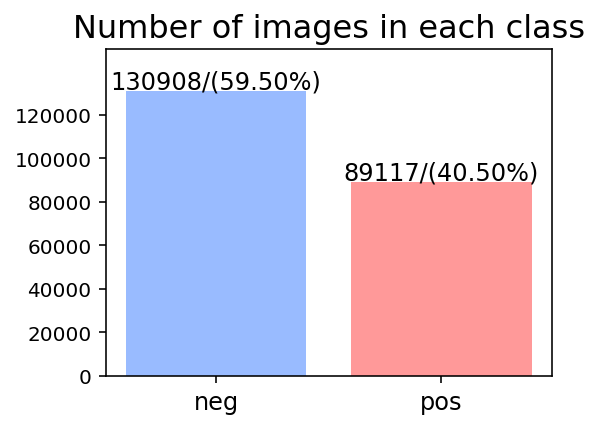

In [4]:
num_neg = labels.label.value_counts().iloc[0]
num_pos = labels.label.value_counts().iloc[1]
num_list = [num_neg, num_pos]
num_total = num_neg+num_pos
width = 0.2
fig = plt.figure(figsize = (4,3))
ax = fig.add_subplot(1,1,1)
plt.bar(np.arange(2), (num_neg,num_pos), color=('#99bbff','#ff9999'))
plt.xticks(np.arange(2), ('neg', 'pos'), size=12)
plt.ylim(0,150000)
plt.yticks(np.arange(0,140000,20000))
for i in np.arange(2):
    ax.text(i, num_list[i]+1000, '{}/({:.2f}%)'.format(num_list[i],num_list[i]/num_total*100),ha = 'center',fontsize=12)
plt.title('Number of images in each class', fontsize=16)

In [5]:
## use 'glob' module to find file paths for all the images
base_dir = '/Volumes/Yuchen_Drive/Histopathologic_Cancer_Detection/train'
total_files = glob(os.path.join(base_dir, '*.tif'))
print('Total number of images: {}'.format(len(total_files)))

Total number of images: 220025


In [6]:
## OpenCV loads color images in BGR mode. For visualization by matplotlib, images need to be converted to RGB mode
def readImage_rgb(img_path):
    '''OpenCV loads color images in BGR mode and converts to RGB mode for visualization;
       output: (H x W x n_channel)'''
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    return img_rgb

In [7]:
img = readImage_rgb(total_files[0])
print(img.shape)

(96, 96, 3)


### Short overview:
1. There are 220025 images in the `train` folder
2. Binary classification
  * 0: negative for tumor
  * 1: positive for tumor
3. The ratio of neg/pos images is around 60%/40% in the train folder, which should be kept roughly the same in training/validation/testing sets
4. Image size is 96x96px, RGB mode
5. According to dataset description: A positive label indicates that the center 32x32px region of a patch contains at least one pixel of tumor tissue

## 1.1 Visualize image files

First, we can view several images from both positive and negative classes with the center 32x32px region highlighted

Text(0.5, 0.98, 'H&E images of lymph node sections (blue: negative; red: Tumor)')

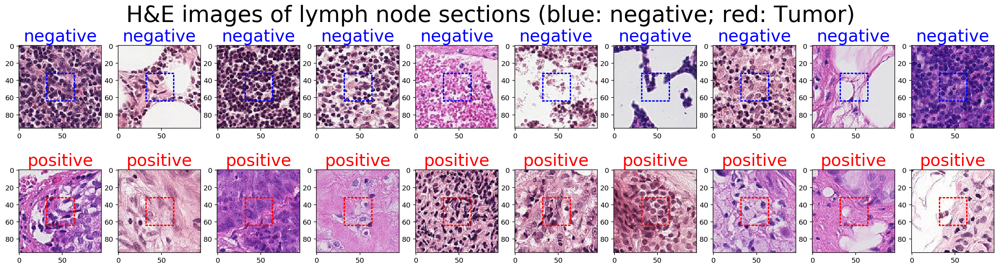

In [11]:
labels_neg = shuffle(labels[labels.label == 0])
labels_pos = shuffle(labels[labels.label == 1])

fig = plt.figure(figsize=(25,6))
for i, img_id in enumerate(labels_neg['id'][:10]):
    img_path = os.path.join(base_dir, img_id)+'.tif'
    ax = fig.add_subplot(2,10,i+1)
    ax.imshow(readImage_rgb(img_path))
    ax.set_title('negative', color = 'blue', fontsize=24)
    box = patches.Rectangle((32,32),32,32,linewidth=2,edgecolor='b',facecolor='none', linestyle=':', capstyle='round')
    ax.add_patch(box)

for i, img_id in enumerate(labels_pos['id'][:10]):
    img_path = os.path.join(base_dir, img_id)+'.tif'
    ax = fig.add_subplot(2,10,i+11)
    ax.imshow(readImage_rgb(img_path))
    ax.set_title('positive', color = 'red', fontsize=24)
    box = patches.Rectangle((32,32),32,32,linewidth=2,edgecolor='r',facecolor='none', linestyle=':', capstyle='round')
    ax.add_patch(box)
fig.suptitle('H&E images of lymph node sections (blue: negative; red: Tumor)', fontsize = 32) 

Next, we can view individual image in each channel (RGB: red/green/blue) separately and in RGB mode

In [9]:
def plotImage_rgb(img_id, title = ''):
    '''Plot image in each of RGB (red/green/blue) channels separately and in RGB mode'''
    img_path = os.path.join(base_dir, img_id)+'.tif'
    img_label = labels[labels.id == img_id].label.item()
    img_rgb = readImage_rgb(img_path)
    
    fig = plt.figure(figsize=(20,8))
    channels = ['Red', 'Green', 'Blue']
    color = ['r','g','b']
    col = 'b' if img_label == 0 else 'r'
    
    ## Plot image in each channel separately
    for idx in np.arange(3):
        ax = fig.add_subplot(1,4,idx+1)
        img = img_rgb[:,:,idx]
        ax.imshow(img, cmap = 'gray')
        ax.set_title(channels[idx], color = color[idx], fontsize = 30)
        box = patches.Rectangle((32,32),32,32,linewidth=2,edgecolor=col,facecolor='none', linestyle=':', capstyle='round')
        ax.add_patch(box)
    
    ## Plot image in RGB mode
    ax = fig.add_subplot(1,4,4)
    ax.imshow(img_rgb)
    ax.set_title('RGB', fontsize = 30)
    box = patches.Rectangle((32,32),32,32,linewidth=2,edgecolor=col,facecolor='none', linestyle=':', capstyle='round')
    ax.add_patch(box)
    
    fig.suptitle(title, fontsize = 36)
    plt.tight_layout()

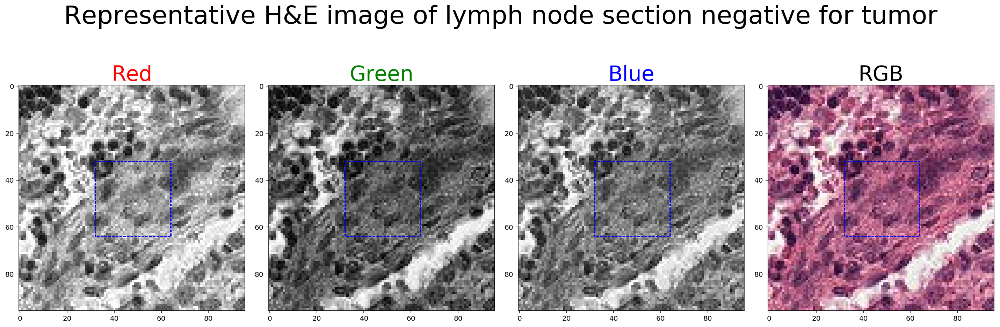

In [43]:
plotImage_rgb(labels_neg['id'].iloc[2], title = 'Representative H&E image of lymph node section negative for tumor')

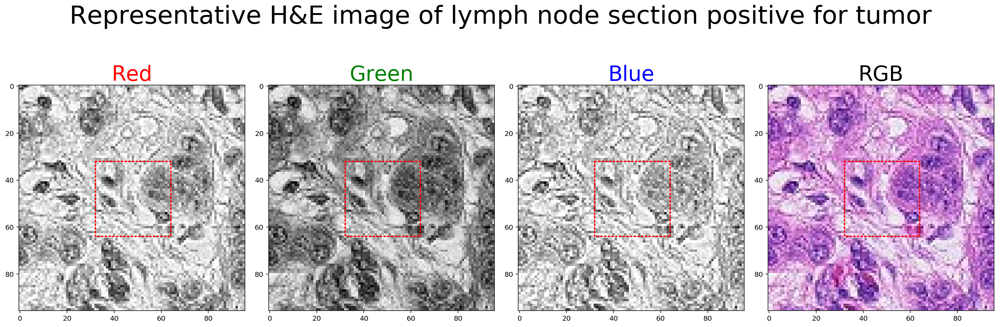

In [45]:
plotImage_rgb(labels_pos['id'].iloc[1], title = 'Representative H&E image of lymph node section positive for tumor')

## 1.2 Basic image pixel statistics and quality control

### 1.2.1 Compute image intensity

Lower-order statistics such as the mean and variance of image pixel intensity can be used to describe texture. To analyze these statistics, the maximum, minimum, 0.1 quantile, 0.9 quantile, mean values and standard deviation of pixel intensity for each image is computed.

In [8]:
pixel_dict = {}
counts = 0

for i, img_id in tqdm_notebook(enumerate(labels.id), '220025 total'):
    pixel_dict[img_id] = {}
    img_path = os.path.join(base_dir, img_id)+'.tif'
    img_rgb = readImage_rgb(img_path)
    img_label = labels[labels.id == img_id].label.item()
    pixel_dict[img_id]['label'] = img_label

    pixel_dict[img_id]['max'] = img_rgb.max()
    pixel_dict[img_id]['min'] = img_rgb.min()

    channel_mean = img_rgb.mean(axis = (0,1), keepdims = True).squeeze()
    channel_std = img_rgb.std(axis = (0,1), keepdims = True).squeeze()
    channel_q01 = np.quantile(img_rgb, 0.1, axis=(0,1), keepdims=True).squeeze()
    channel_q09 = np.quantile(img_rgb, 0.9, axis=(0,1), keepdims=True).squeeze()
    pixel_dict[img_id]['red_mean'], pixel_dict[img_id]['green_mean'], pixel_dict[img_id]['blue_mean'] = channel_mean
    pixel_dict[img_id]['red_std'], pixel_dict[img_id]['green_std'], pixel_dict[img_id]['blue_std'] = channel_std
    pixel_dict[img_id]['red_q01'], pixel_dict[img_id]['green_q01'], pixel_dict[img_id]['blue_q01'] = channel_q01
    pixel_dict[img_id]['red_q09'], pixel_dict[img_id]['green_q09'], pixel_dict[img_id]['blue_q09'] = channel_q09
    
    counts += 1

In [90]:
pixel_df = pd.DataFrame.from_dict(pixel_dict, orient = 'index')
## save the pixel file
pixel_df.to_csv('Histology_pixel_df.csv', index_label = 'img_id')
pixel_df = pd.read_csv('Histology_pixel_df.csv', index_col = 'img_id')

In [91]:
pixel_df.head()

,label,max,min,red_mean,green_mean,blue_mean,red_std,green_std,blue_std,red_q01,green_q01,blue_q01,red_q09,green_q09,blue_q09
img_id,,,,,,,,,,,,,,,
00001b2b5609af42ab0ab276dd4cd41c3e7745b5,1,255,0,197.415148,142.878147,170.420139,44.441462,51.713479,45.038927,132.0,73.0,109.0,251.0,215.0,232.0
000020de2aa6193f4c160e398a8edea95b1da598,0,255,4,231.804796,216.886827,222.537543,31.002915,46.492510,38.862766,185.0,145.0,162.0,255.0,250.0,252.0
00004aab08381d25d315384d646f5ce413ea24b1,0,255,0,140.618381,101.462999,134.143989,72.516327,71.582249,64.264791,46.0,13.0,54.0,244.0,207.0,227.0
0000d563d5cfafc4e68acb7c9829258a298d9b6a,0,255,0,223.980469,193.386827,223.504774,32.781749,50.003034,32.194153,180.0,117.0,175.0,254.0,239.0,255.0
0000da768d06b879e5754c43e2298ce48726f722,1,255,0,152.354058,96.614366,175.670139,55.503755,47.118179,39.301026,69.0,31.0,120.0,217.0,155.0,225.0


In [92]:
pixel_df.describe()

,label,max,min,red_mean,green_mean,blue_mean,red_std,green_std,blue_std,red_q01,green_q01,blue_q01,red_q09,green_q09,blue_q09
count,220025.000000,220025.000000,220025.000000,220025.000000,220025.000000,220025.000000,220025.000000,220025.000000,220025.000000,220025.000000,220025.000000,220025.000000,220025.000000,220025.000000,220025.000000
mean,0.405031,254.687817,4.136044,179.125200,139.294485,177.596841,46.108036,51.168616,41.924039,116.526115,72.024893,121.966024,234.373914,202.513176,229.011531
std,0.490899,6.632540,15.317364,37.027578,48.712194,33.487889,14.634433,13.553204,12.727611,53.599321,54.290280,45.902858,21.181939,38.304480,20.319043
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,255.000000,0.000000,151.126736,101.087457,154.762261,36.702484,42.803739,33.600484,71.000000,31.000000,83.000000,224.000000,175.000000,220.000000
50%,0.000000,255.000000,0.000000,178.442383,130.456706,177.330187,48.129417,51.501219,41.736783,104.000000,54.000000,120.000000,240.000000,212.000000,233.000000
75%,1.000000,255.000000,0.000000,210.502062,177.077257,202.271376,57.223053,60.550253,51.318471,154.000000,97.000000,150.000000,251.000000,234.000000,244.000000
max,1.000000,255.000000,255.000000,255.000000,255.000000,255.000000,111.810674,111.115831,111.763415,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000


To check images with all pixel values very low (black)

In [93]:
img_dark = pixel_df[pixel_df['max'] < 30].index
print('Number of dark images: {}'.format(len(img_dark)))

Number of dark images: 1


To check images with all pixel values very high (bright)

In [94]:
img_bright = pixel_df[pixel_df['min'] > 225].index
img_bright_neg = pixel_df[pixel_df['min'] > 225].label.value_counts().iloc[0]
img_bright_pos = pixel_df[pixel_df['min'] > 225].label.value_counts().iloc[1]
print('Number of bright images: {}({}_neg/{}_pos)'.format(len(img_bright), img_bright_neg, img_bright_pos))

Number of bright images: 127(119_neg/8_pos)


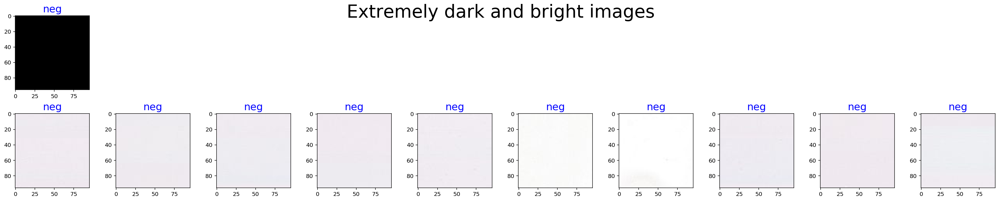

In [14]:
fig = plt.figure(figsize=(25,5))
for i,img_id in enumerate(img_dark):
    img_path = os.path.join(base_dir, img_id)+'.tif'
    ax = fig.add_subplot(2,10,i+1)
    ax.imshow(readImage_rgb(img_path))
    img_label = pixel_df.loc[img_id,].label
    (col, title_label) = ('b', 'neg') if img_label == 0 else ('r', 'pos')
    ax.set_title(title_label,color = col, fontsize=18)
for i,img_id in enumerate(np.random.choice(img_bright, 10)):
    img_path = os.path.join(base_dir, img_id)+'.tif'
    ax = fig.add_subplot(2,10,i+11)
    ax.imshow(readImage_rgb(img_path))
    label = pixel_df.loc[img_id,].label
    (col, title_label) = ('b', 'neg') if img_label == 0 else ('r', 'pos')
    ax.set_title(title_label,color = col, fontsize=18)
fig.suptitle('Extremely dark and bright images', fontsize = 32)
plt.tight_layout()

Images that are either too dark or too bright can provide very less information. The dark images may be caused by underexposure. The bright images may be due to overexposure or an empty area without stained tissue is captured. In real application of medical image classification, a quality-control process will be included before classification and images with underexposure/overexposure/out-of-focus/empty area will be eliminated. Thus, images with extremely high and low intensities should be excluded from the dataset. 

In [95]:
pixel_df_filter = pixel_df[(pixel_df['max'] >= 30) & (pixel_df['min'] <= 225)]
print('Number of images after removing dark/bright images: {}'.format(pixel_df_filter.shape[0]))

Number of images after removing dark/bright images: 219897


### 1.2.2 Compare pixel intensity distribution for 'neg' and 'pos' classes of images

Instead of computing the distribution of each individual pixel value of images, the average pixel intensity of each channel for each image is computed and used to compare the pixel intensity distribution between neg/pos classes.

Text(0.5, 0.98, 'Average pixel intensity for images positive for tumor detection')

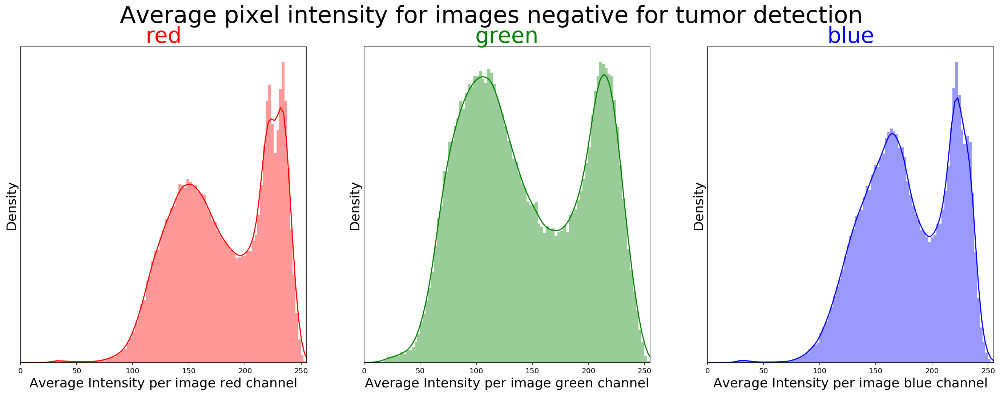

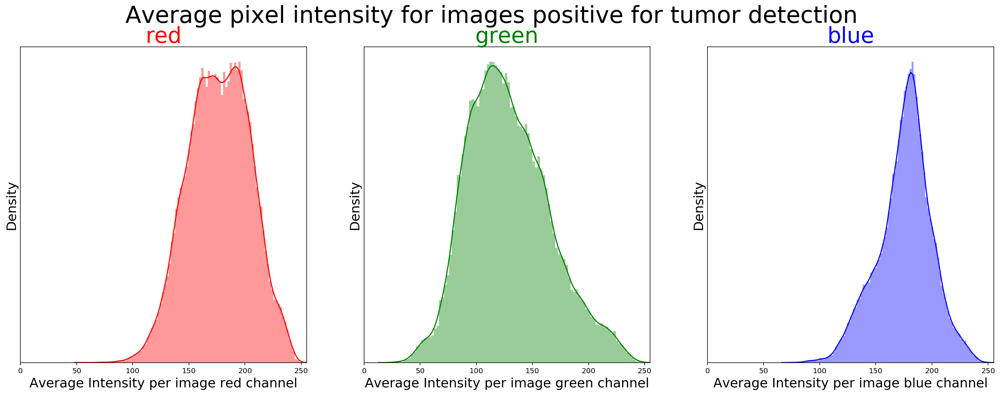

In [17]:
col = ['red', 'green', 'blue']
col_mean = ['red_mean', 'green_mean', 'blue_mean']
fig, ax = plt.subplots(1,3, figsize=(24,8))
for i in np.arange(3):
    sns.distplot(pixel_df_filter[pixel_df_filter.label==0][col_mean[i]], bins=100, color=col[i], ax = ax[i])
    ax[i].set_title(col[i], color=col[i], fontsize=30)
    ax[i].set_xlabel('Average Intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_xlim(0,255)
    ax[i].set_yticks([])
fig.suptitle('Average pixel intensity for images negative for tumor detection', fontsize = 32)

fig, ax = plt.subplots(1,3, figsize=(24,8))
for i in np.arange(3):
    sns.distplot(pixel_df_filter[pixel_df_filter.label==1][col_mean[i]], bins=100, color=col[i], ax = ax[i])
    ax[i].set_title(col[i], color=col[i], fontsize=30)
    ax[i].set_xlabel('Average Intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_xlim(0,255)
    ax[i].set_yticks([])
fig.suptitle('Average pixel intensity for images positive for tumor detection', fontsize = 32)

Text(0.5, 0.98, 'Average pixel intensity for images neg/pos for tumor detection')

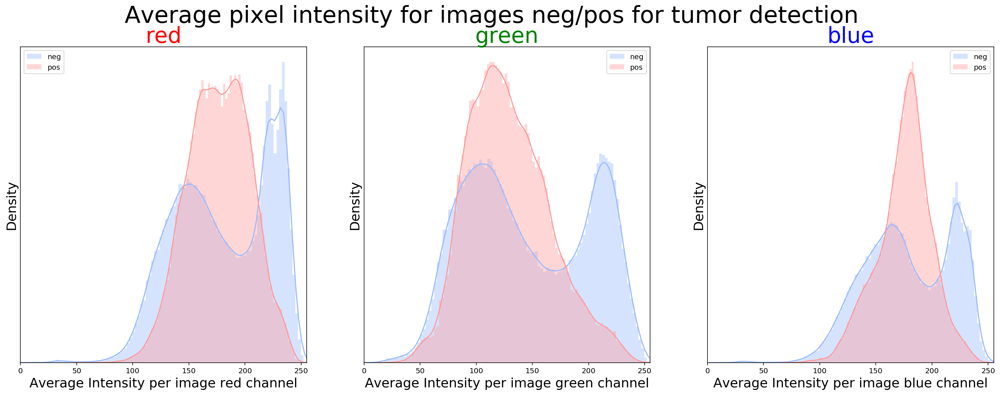

In [19]:
col = ['red', 'green', 'blue']
col_mean = ['red_mean', 'green_mean', 'blue_mean']
fig, ax = plt.subplots(1,3, figsize=(24,8))
for i in np.arange(3):
    sns.distplot(pixel_df_filter[pixel_df_filter.label==0][col_mean[i]], bins=100, color='#99bbff', label='neg', ax = ax[i])
    sns.distplot(pixel_df_filter[pixel_df_filter.label==1][col_mean[i]], bins=100, color='#ff9999', label = 'pos', ax = ax[i])
    ax[i].set_title(col[i], color=col[i], fontsize=30)
    ax[i].set_xlabel('Average Intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_xlim(0,255)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_yticks([])
    ax[i].legend()
fig.suptitle('Average pixel intensity for images neg/pos for tumor detection', fontsize = 32)

Distribution of the standard deviation of pixel intensity of each channel for each image is computed and shown below.

Text(0.5, 0.98, 'Standard deviation of pixel intensity for images positive for tumor detection')

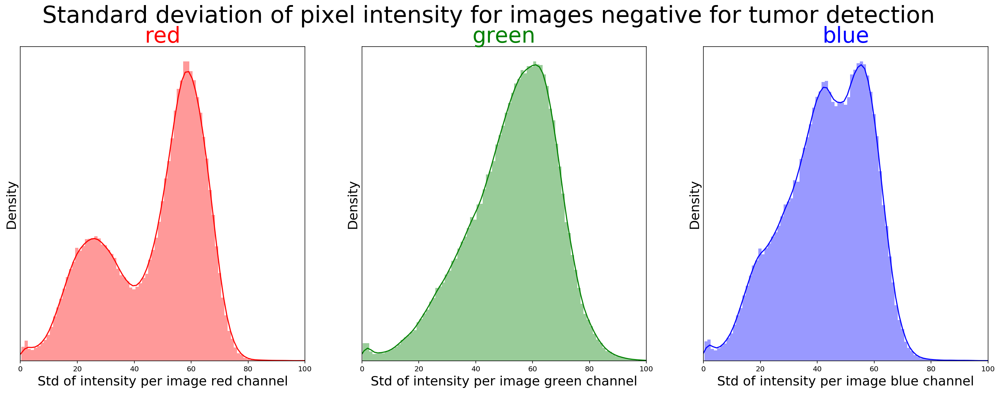

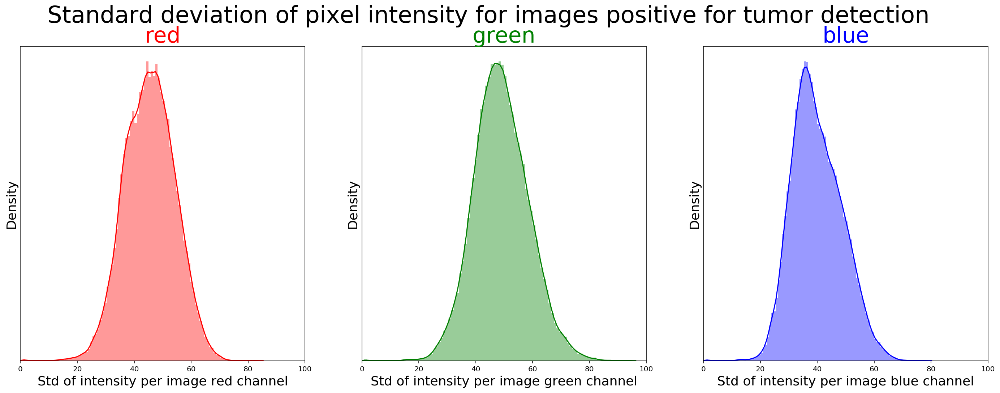

In [23]:
col = ['red', 'green', 'blue']
col_std = ['red_std', 'green_std', 'blue_std']
fig, ax = plt.subplots(1,3, figsize=(24,8))
for i in np.arange(3):
    sns.distplot(pixel_df_filter[pixel_df_filter.label==0][col_std[i]], bins=100, color=col[i], ax = ax[i])
    ax[i].set_title(col[i], color=col[i], fontsize=30)
    ax[i].set_xlabel('Std of intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_xlim(0,100)
    ax[i].set_yticks([])
fig.suptitle('Standard deviation of pixel intensity for images negative for tumor detection', fontsize = 32)

fig, ax = plt.subplots(1,3, figsize=(24,8))
for i in np.arange(3):
    sns.distplot(pixel_df_filter[pixel_df_filter.label==1][col_std[i]], bins=100, color=col[i], ax = ax[i])
    ax[i].set_title(col[i], color=col[i], fontsize=30)
    ax[i].set_xlabel('Std of intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_xlim(0,100)
    ax[i].set_yticks([])
fig.suptitle('Standard deviation of pixel intensity for images positive for tumor detection', fontsize = 32)

Text(0.5, 0.98, 'Standard deviation of pixel intensity for images neg/pos for tumor detection')

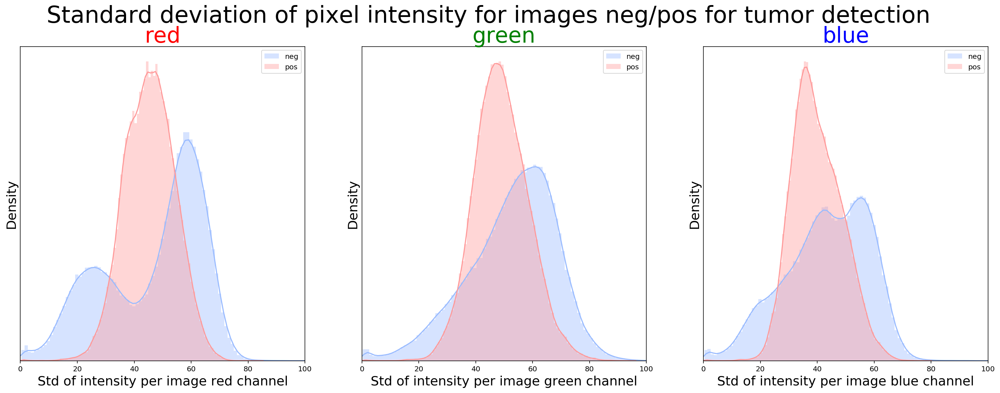

In [24]:
col = ['red', 'green', 'blue']
col_std = ['red_std', 'green_std', 'blue_std']
fig, ax = plt.subplots(1,3, figsize=(24,8))
for i in np.arange(3):
    sns.distplot(pixel_df_filter[pixel_df_filter.label==0][col_std[i]], bins=100, color='#99bbff', label='neg', ax = ax[i])
    sns.distplot(pixel_df_filter[pixel_df_filter.label==1][col_std[i]], bins=100, color='#ff9999', label = 'pos', ax = ax[i])
    ax[i].set_title(col[i], color=col[i], fontsize=30)
    ax[i].set_xlabel('Std of intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_xlim(0,100)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_yticks([])
    ax[i].legend()
fig.suptitle('Standard deviation of pixel intensity for images neg/pos for tumor detection', fontsize = 32)

Average staining intensity showed large variation. Specifically, slides for lymph nodes without metastasis detection exhibits a bimodal distribution of pixel intensity with a group of slides showing extremely high average intensity values. One possible explanation is that these are areas where the majority is the background or without tissue stained. Another possiblity is that these are areas with adipose tissue which has an 'empty' appearance becuase the high content of fat dissolves during H&E staining.  

To further confirm the hypothesis that the high intensity peak in 'neg' slides are due to minimal stained tissue or adipose tissue, images with relatively high intensity in all three channels are selected based on a high 0.1 quantile value. 

In [20]:
mask = ((pixel_df_filter.red_q01 > 225) & (pixel_df_filter.green_q01 > 225) & (pixel_df_filter.blue_q01 > 225))
print('Number of relatively bright images: {}'.format(sum(mask)))
mask_index = pixel_df_filter[mask].index
pixel_df_filter[mask].label.value_counts()

Number of relatively bright images: 2632


0    2551
1      81
Name: label, dtype: int64

As expected, the majority of the images with high intensity (q01 > 255) in all three channels are from 'neg' class (neg/pos: 2542/81).

Here, we visualize some of the high intensity images:

Text(0.5, 0.98, 'Images with high intensity')

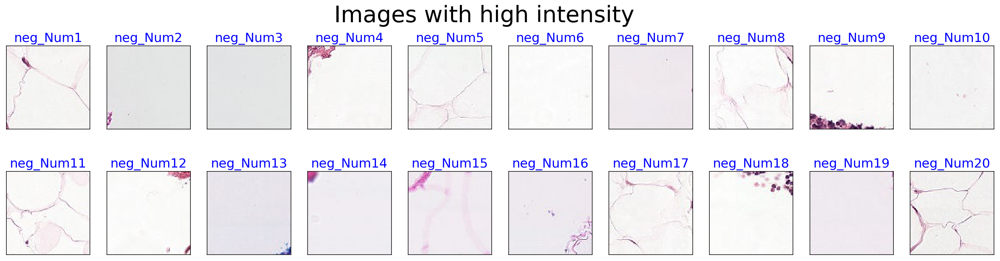

In [95]:
fig = plt.figure(figsize=(25,6))
for i,idx in enumerate(np.random.choice(mask_index, 20)):
    img_path = os.path.join(base_dir, idx)+'.tif'
    ax = fig.add_subplot(2,10,i+1,xticks=[], yticks=[])
    ax.imshow(readImage_rgb(img_path))
    label = pixel_df.loc[idx,].label
    if label == 0:
        ax.set_title('neg_Num{}'.format(i+1),color='b',fontsize=18)
    elif label == 1:
        ax.set_title('pos_Num{}'.format(i+1),color = 'r',fontsize=18)
fig.suptitle('Images with high intensity', fontsize = 32)

Consistent with the hypothesis, some of the high intensity images are areas with minimal stained tissue (eg. images_Num2/4/9) and some are adipose tissue (eg. images_Num1/5/20).

Specifically, we visualize some of the high intensity images from 'pos' class:

Text(0.5, 0.98, 'Images with high intensity')

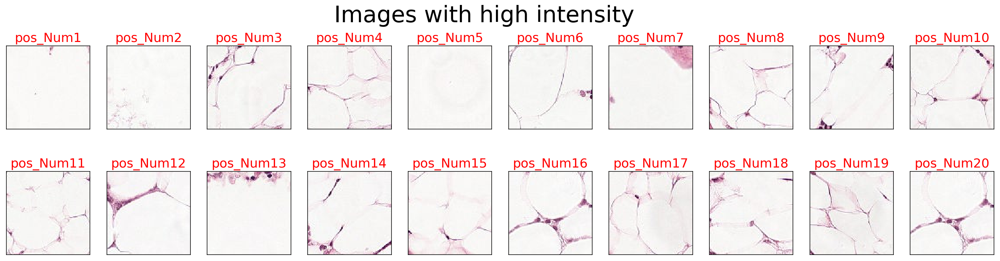

In [97]:
high_intensity = pixel_df_filter[mask][pixel_df_filter2.label == 1]
fig = plt.figure(figsize=(25,6))
for i,idx in enumerate(np.random.choice(high_intensity.index.values, 20)):
    img_path = os.path.join(base_dir, idx)+'.tif'
    ax = fig.add_subplot(2,10,i+1,xticks=[], yticks=[])
    ax.imshow(readImage_rgb(img_path))
    label = pixel_df.loc[idx,].label
    if label == 0:
        ax.set_title('neg_Num{}'.format(i+1),color='b',fontsize=18)
    elif label == 1:
        ax.set_title('pos_Num{}'.format(i+1),color = 'r',fontsize=18)
fig.suptitle('Images with high intensity', fontsize = 32)

Some tumor types such as clear cell renal cell carcinoma (ccRCC) contains high lipid content and can also exhibit the 'clear' appearance. However, for images such as Num1/5/7, the majority of the area (especially the center 32x32px region) really has no stained tissue, and it's not clear why these images are classified as 'pos' for tumor detection. Since these are very rare cases, I decide not to further exclude these potentially misclassified images from the training dataset. 

Overall, based on the above analysis, the high intensity peak in 'neg' class can be partially explained by the existence of empty area or adipose tissue. Since areas either without tissue or with adipose tissue are also considered 'negative' for tumor detection and these cases happen frequently in routine histopathological slides, I didn't apply further filtering based on pixel intensity. 

However, in addition to the high intensity peak in 'neg' slides, the average pixel intensity in each channel varies considerably between slides with and without metastasis. This might be due to tissue/tumor heterogeneity.



Next, to further visualize the pixel distribution within each image, I randomly selected 1000 images from each class and computed the intensity of each pixel for every image. 

In [96]:
pixel_df_filter_neg = shuffle(pixel_df_filter[pixel_df_filter.label == 0])
pixel_df_filter_pos = shuffle(pixel_df_filter[pixel_df_filter.label == 1])
img_pixel_dict = {}
for img_id in pixel_df_filter_neg.index.values[:1000]:
    img_path = os.path.join(base_dir, img_id)+'.tif'
    img = readImage_rgb(img_path).transpose(2,0,1)
    img = img.reshape(1,-1).squeeze()
    img_pixel_dict[img_id] = img
    
for img_id in pixel_df_filter_pos.index.values[:1000]:
    img_path = os.path.join(base_dir, img_id)+'.tif'
    img = readImage_rgb(img_path).transpose(2,0,1)
    img = img.reshape(1,-1).squeeze()
    img_pixel_dict[img_id] = img

In [97]:
img_pixel_df = pd.DataFrame.from_dict(img_pixel_dict, orient = 'columns').T

In [98]:
img_pixel_df['label'] = np.append(np.repeat(0,1000), np.repeat(1,1000))

In [99]:
img_pixel_df.head()

,0,1,2,3,4,5,6,7,8,9,...,27639,27640,27641,27642,27643,27644,27645,27646,27647,label
79e5b38e3c133462862f8baf21a3a233fcbc9513,255,255,255,221,250,222,216,223,247,255,...,219,248,185,240,192,244,191,242,186,0
e21477ec3d1cbccea9b0355b4d8aac9204ec51d7,93,130,115,111,127,204,171,226,255,200,...,136,41,99,58,53,91,241,225,235,0
381dae0aedf58b7879fa3b16da1b99c1a1eff959,255,248,224,205,214,175,132,209,134,143,...,106,70,69,53,73,52,149,60,50,0
db8fda353f6ce7aebec5274880504f8fab1a9da9,152,138,88,127,144,183,182,140,44,50,...,222,223,221,217,225,230,254,228,116,0
cb5296f72ad6d61fadfd311f9bb9909ca3abbfbc,247,247,246,246,246,246,247,247,247,247,...,238,244,244,244,245,246,247,248,249,0


In [87]:
img_pixel_df.to_csv('Histology_individual_pixel_df_2000.csv')
# img_pixel_df = pd.read_csv('Histology_individual_pixel_df_2000.csv')

Text(0.5, 0.98, 'Pixel intensity distribution for images positive for tumor detection')

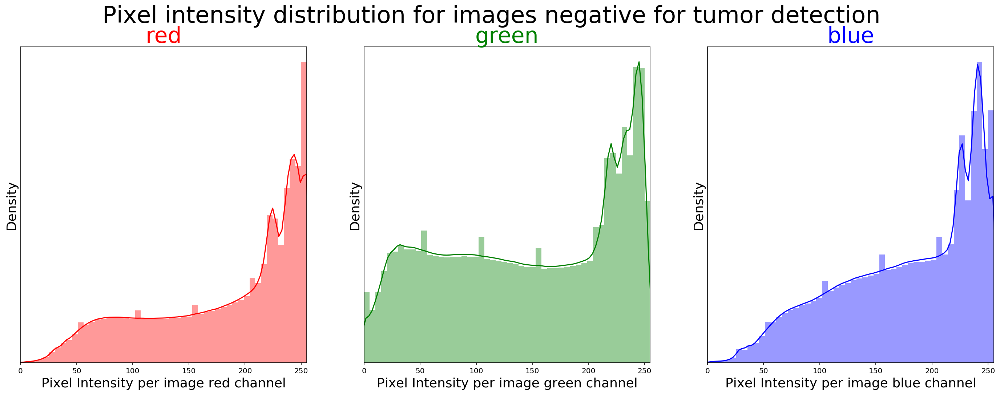

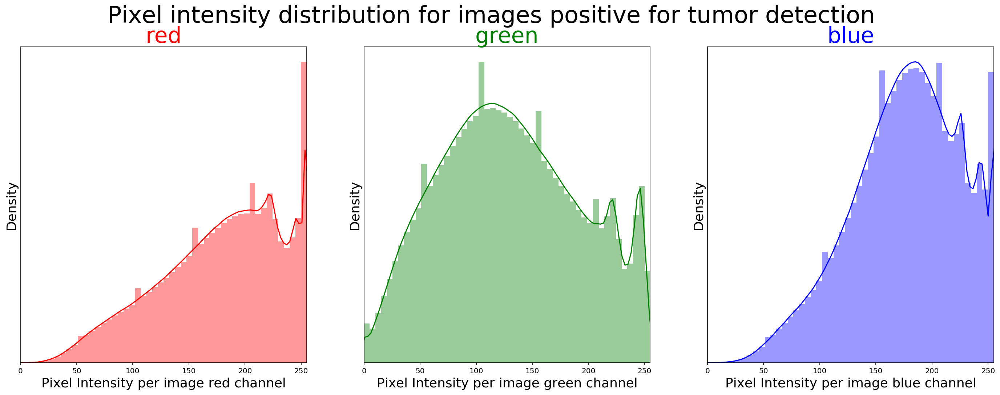

In [100]:
col = ['red', 'green', 'blue']
fig, ax = plt.subplots(1,3,figsize=(24,8))
for i in np.arange(3):
    sns.distplot(img_pixel_df[img_pixel_df.label == 0].iloc[:,i*96*96:(i+1)*96*96].values.flatten(), bins = 50, color=col[i], ax = ax[i])
    ax[i].set_title(col[i], color=col[i], fontsize=30)
    ax[i].set_xlabel('Pixel Intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_xlim(0,255)
    ax[i].set_yticks([])
fig.suptitle('Pixel intensity distribution for images negative for tumor detection', fontsize=32)

fig, ax = plt.subplots(1,3,figsize=(24,8))
for i in np.arange(3):
    sns.distplot(img_pixel_df[img_pixel_df.label == 1].iloc[:,i*96*96:(i+1)*96*96].values.flatten(), bins = 50, color=col[i], ax = ax[i])
    ax[i].set_title(col[i], color=col[i], fontsize=30)
    ax[i].set_xlabel('Pixel Intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_xlim(0,255)
    ax[i].set_yticks([])
fig.suptitle('Pixel intensity distribution for images positive for tumor detection', fontsize=32)

Text(0.5, 0.98, 'Pixel intensity distribution for images neg/pos for tumor detection')

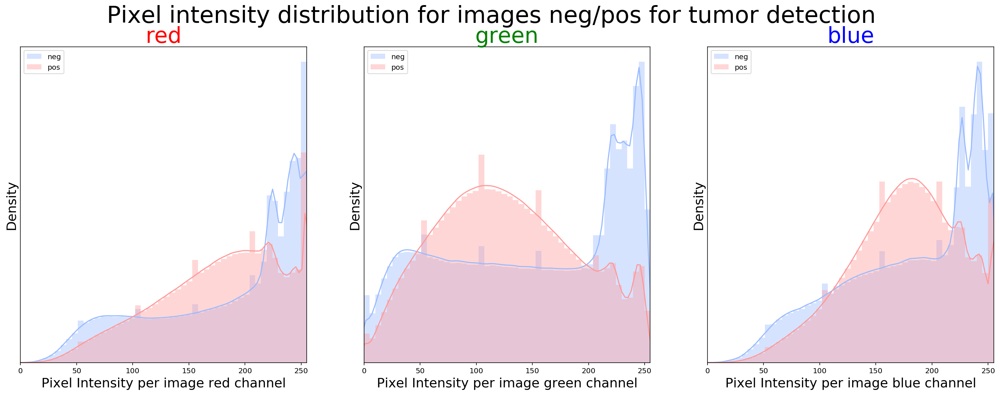

In [54]:
col = ['red', 'green', 'blue']
fig, ax = plt.subplots(1,3, figsize=(24,8))
for i in np.arange(3):
    sns.distplot(img_pixel_df[img_pixel_df.label == 0].iloc[:,i*96*96:(i+1)*96*96].values.flatten(), bins=50, color='#99bbff', label='neg', ax = ax[i])
    sns.distplot(img_pixel_df[img_pixel_df.label == 1].iloc[:,i*96*96:(i+1)*96*96].values.flatten(), bins=50, color='#ff9999', label = 'pos', ax = ax[i])
    ax[i].set_title(col[i], color=col[i], fontsize=30)
    ax[i].set_xlabel('Pixel Intensity per image {} channel'.format(col[i]), fontsize=18)
    ax[i].set_xlim(0,255)
    ax[i].set_ylabel('Density', fontsize=18)
    ax[i].set_yticks([])
    ax[i].legend()
fig.suptitle('Pixel intensity distribution for images neg/pos for tumor detection', fontsize = 32)

As we shown by the density plots above, the pixel intensity in the single pixel level within each image has very different distributions between the `neg` and `pos` classes. This confirms the previous findings that lower-order statistics such as the mean and variance of image pixel intensity can serve as potential features used for classification.

### 1.2.3 Visualize image clustering using t-SNE plot

**t-SNE** (t-distributed Stochastic Neighbor Embedding) is a non-linear dimensionality reduction approach for visualization of high-dimensional data in a two- or three-dimensional space. Objects with high similarity are modeled by nearby points and objects with low similarity are modeled by distant points in t-SNE plot.

In [101]:
def pixel_tsne_plot(feature_df, classes, title='t-SNE plot'):
    label_to_id_dict = {v:i for i,v in enumerate(classes)}
    id_to_label_dict = {v: k for k, v in label_to_id_dict.items()}
    feature_df['class_label'] = feature_df.label.map(id_to_label_dict)
    data = feature_df.iloc[:,:-2]
    data = np.reshape(data, (data.shape[0], -1)).astype(np.float64)
    data_2d = bh_sne(data)
    df_subset = pd.DataFrame({'tsne-2d-one':data_2d[:,0], 'tsne-2d-two':data_2d[:,1], 'target':feature_df.class_label})
    plt.figure(figsize=(8,8))
    tsne = sns.scatterplot(
        x="tsne-2d-one", y="tsne-2d-two",
        hue="target",
        hue_order=classes,
        palette=['#99bbff','#ff9999'],
        data=df_subset,
        legend="full",
        alpha=1)
    plt.title(title, fontsize=20)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show(tsne)

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


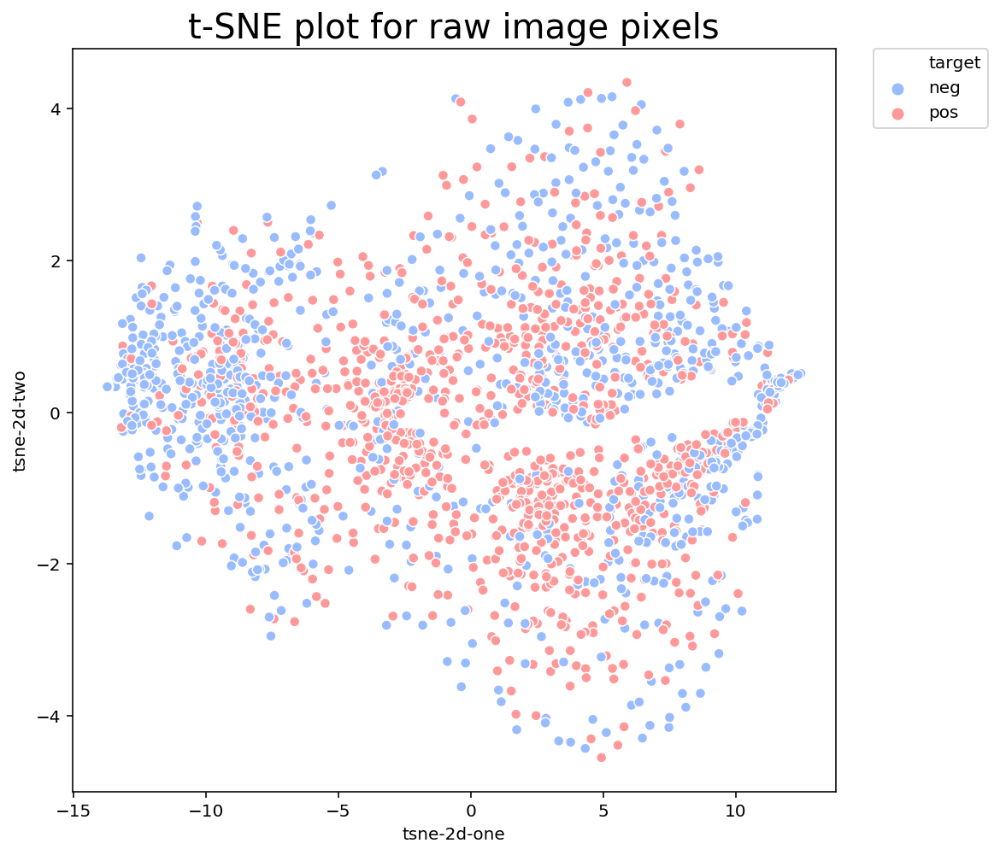

In [102]:
from tsne import bh_sne
classes = ['neg', 'pos']
pixel_tsne_plot(shuffle(img_pixel_df), classes, title = 't-SNE plot for raw image pixels')

As shown by the t-SNE plot, images from `neg` and `pos` classes can hardly be separated by the raw pixel values. We do need to build more complex and powerful models such as convolutional neural network (CNN) in order to classify the images without or with tumor infiltration. 

## 1.3 Split images in `train` folder to training, validation and test datasets

Kaggle provides images in both `train` folder and `test` folder, images in `test` folder don't have labels and are only used for final submission to the competition. In order to improve the model training process, a validation dataset is required.

The main purpose of the validation set is:
* Provide an unbiased evaluation of a model fit on the training dataset
* Fine-tune the hyperparameters
* Prevent overfitting

Although the model is only trained on training dataset, the final model is actually selected in favor of both the training and validation datasets due to the design of the model training process (hyperparameters are fine-tuned based on the performance on the validation dataset and the final model is selected based on the evaluation metric such as accuracy score with the best performance in the validation dataset). 

Thus, a test dataset is needed to provide a final unbiased evaluation and is result is considered as the gold standard as the evaluation of a trained model. For learning purposes, the images in the original `test` folder are not used as test dataset becuase the labels are unknown.

We need to split the 219897 images (after removing extremely dark/bright image) into training, validation, and test datasets with no overlapping of any data point. Here are the splitting criteria:
* The splitting ratio is 80%/10%/10% for training/validation/testing datasets
* The class ratio of 'neg'/'pos' (around 60/40) images needs to be maintained relatively equal in each dataset

In [64]:
## drop outliers (extremely dark and bright images identified in section 1.2.1)
train_val_test_df = labels.copy()
train_val_test_df.set_index('id', inplace = True)
train_val_test_df = train_val_test_df.drop(labels = img_dark, axis = 0)
train_val_test_df = train_val_test_df.drop(labels = img_bright, axis = 0)
print('Number of images after removing dark/bright images: {}'.format(train_val_test_df.shape[0]))

Number of images after removing dark/bright images: 219897


In [66]:
train_df, val_test_df = train_test_split(train_val_test_df, test_size=0.2, stratify=train_val_test_df.label, random_state=123)
val_df, test_df = train_test_split(val_test_df, test_size=0.5, stratify=val_test_df.label, random_state=123)

In order to use `torchvision.datasets.ImageFolder` to load images, `neg` and `pos` folders will be created for training, validation and test datasets. Images will be stratified to each folder in each dataset according to the image `id` info in the above splitting results. Here is the directory structure:

<img src="images/Image1_directory_structure.tif" width=300px>

In [27]:
## Create directories for training/validation/test datasets according to the above directory structure
base_dir2 = '/Volumes/Yuchen_Drive/Histopathologic_Cancer_Detection/train_val_test'
train_dir2 = os.path.join(base_dir2, 'train')
val_dir2 = os.path.join(base_dir2, 'val')
test_dir2 = os.path.join(base_dir2, 'test')
os.mkdir(base_dir2)
os.mkdir(train_dir2)
os.mkdir(val_dir2)
os.mkdir(test_dir2)

train_neg_dir2 = os.path.join(train_dir2, 'neg')
train_pos_dir2 = os.path.join(train_dir2, 'pos')
val_neg_dir2 = os.path.join(val_dir2, 'neg')
val_pos_dir2 = os.path.join(val_dir2, 'pos')
test_neg_dir2 = os.path.join(test_dir2, 'neg')
test_pos_dir2 = os.path.join(test_dir2, 'pos')
os.mkdir(train_neg_dir2)
os.mkdir(train_pos_dir2)
os.mkdir(val_neg_dir2)
os.mkdir(val_pos_dir2)
os.mkdir(test_neg_dir2)
os.mkdir(test_pos_dir2)

In [72]:
base_dir2 = '/Volumes/Yuchen_Drive/Histopathologic_Cancer_Detection/train_val_test'
train_dir2 = os.path.join(base_dir2, 'train')
val_dir2 = os.path.join(base_dir2, 'val')
test_dir2 = os.path.join(base_dir2, 'test')

train_neg_dir2 = os.path.join(train_dir2, 'neg')
train_pos_dir2 = os.path.join(train_dir2, 'pos')
val_neg_dir2 = os.path.join(val_dir2, 'neg')
val_pos_dir2 = os.path.join(val_dir2, 'pos')
test_neg_dir2 = os.path.join(test_dir2, 'neg')
test_pos_dir2 = os.path.join(test_dir2, 'pos')

In [ ]:
for img in train_df.index:
    target = train_df.loc[img, 'label']
    if target == 0:
        folder = 'neg'
    if target == 1:
        folder = 'pos'
    source_path = os.path.join(base_dir, img+'.tif')
    dest_path = os.path.join(train_dir2, folder, img+'.tif')
    shutil.copyfile(source_path, dest_path)

for img in val_df.index:
    target = val_df.loc[img, 'label']
    if target == 0:
        folder = 'neg'
    if target == 1:
        folder = 'pos'
    source_path = os.path.join(base_dir, img+'.tif')
    dest_path = os.path.join(val_dir2, folder, img+'.tif')
    shutil.copyfile(source_path, dest_path)

for img in test_df.index:
    target = test_df.loc[img, 'label']
    if target == 0:
        folder = 'neg'
    if target == 1:
        folder = 'pos'
    source_path = os.path.join(base_dir, img+'.tif')
    dest_path = os.path.join(test_dir2, folder, img+'.tif')
    shutil.copyfile(source_path, dest_path)

In [74]:
print('Number of total images in original train folder: {}'.format(train_val_test_df.shape[0]))
print('-'*60)
print('After spliting into training and validation sets:')
train_imgs = glob(os.path.join(train_dir2, '*/*.tif'))
val_imgs = glob(os.path.join(val_dir2, '*/*.tif'))
test_imgs = glob(os.path.join(test_dir2, '*/*.tif'))
print('Number of images in training set: {}'.format(len(train_imgs)))
print('Number of images in validation set: {}'.format(len(val_imgs)))
print('Number of images in testing set: {}'.format(len(test_imgs)))
print('-'*60)
train_imgs_neg = glob(os.path.join(train_neg_dir2, '*.tif'))
train_imgs_pos = glob(os.path.join(train_pos_dir2, '*.tif'))
val_imgs_neg = glob(os.path.join(val_neg_dir2, '*.tif'))
val_imgs_pos = glob(os.path.join(val_pos_dir2, '*.tif'))
test_imgs_neg = glob(os.path.join(test_neg_dir2, '*.tif'))
test_imgs_pos = glob(os.path.join(test_pos_dir2, '*.tif'))
print('Neg(0)/Pos(1) distribution in train_folder: \n{}/{} ({:.2f}%/{:.2f}%)'.format(len(train_imgs_neg), len(train_imgs_pos), len(train_imgs_neg)/len(train_imgs)*100, len(train_imgs_pos)/len(train_imgs)*100))
print('')
print('Neg(0)/Pos(1) distribution in val_folder: \n{}/{} ({:.2f}%/{:.2f}%)'.format(len(val_imgs_neg), len(val_imgs_pos), len(val_imgs_neg)/len(val_imgs)*100, len(val_imgs_pos)/len(val_imgs)*100))
print('')
print('Neg(0)/Pos(1) distribution in test_folder: \n{}/{} ({:.2f}%/{:.2f}%)'.format(len(test_imgs_neg), len(test_imgs_pos), len(test_imgs_neg)/len(test_imgs)*100, len(test_imgs_pos)/len(test_imgs)*100))

Number of total images in original train folder: 219897
------------------------------------------------------------
After spliting into training and validation sets:
Number of images in training set: 175917
Number of images in validation set: 21990
Number of images in testing set: 21990
------------------------------------------------------------
Neg(0)/Pos(1) distribution in train_folder: 
104630/71287 (59.48%/40.52%)

Neg(0)/Pos(1) distribution in val_folder: 
13079/8911 (59.48%/40.52%)

Neg(0)/Pos(1) distribution in test_folder: 
13079/8911 (59.48%/40.52%)


So far, images from `train` folder have been filtered based on pixel intensity and stratified into training/validation/test datasets with equal class ratio (neg/pos around 60%/40%).

Next, a convolutional neural network (CNN) will be built to train the binary classification of the H&E images.

# 2. Build CNN and train images

## 2.1 Image pre-processing and data loading

Image transformation:

1.According to the description of the dataset, all the images have size 96x96px, RGB mode. Although the image classfication is based on the presence of tumor cells in the center 32x32px region, tumor metastasis is highly impacted by microenvironment and may exhibit specific niche structure (eg. tumor-stromal interaction, angiogenesis, etc). In order to preserve the useful information from the tumor surrounding areas that could help improve metastasis detection, no image cropping is applied.


2.To prevent overfitting, the following image augmentations will be applied:
   * random rotation
   * random horizontal/vertical flip

   Augmentation will be applied to both training and validation datasets to perform random modifications to both datasets -- test time augmentation (TTA). During the validation process, the predictions will be based on the augmented images.


3.Normalization: pixel values are normalized to the range [-1, 1]. After normalization, all features will have the same range and contribute equally to the model. In addition, the model will be less sensitive to small changes in weights and easier to be optimized.

In [62]:
## Batch_size: define the numebr of sampels that will be propagated through the network in one iteration and update the weights
BATCH_SIZE=32

In [63]:
train_transforms = transforms.Compose([
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

In [66]:
train_path = train_dir2
val_path = val_dir2

train_data = datasets.ImageFolder(train_path, transform = train_transforms)
val_data = datasets.ImageFolder(val_path, transform = train_transforms)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=BATCH_SIZE, shuffle = True)
val_loader = torch.utils.data.DataLoader(val_data, batch_size=BATCH_SIZE, shuffle = True)

Visualize images post augmentation

Text(0.5, 0.98, 'H&E images post augmentation')

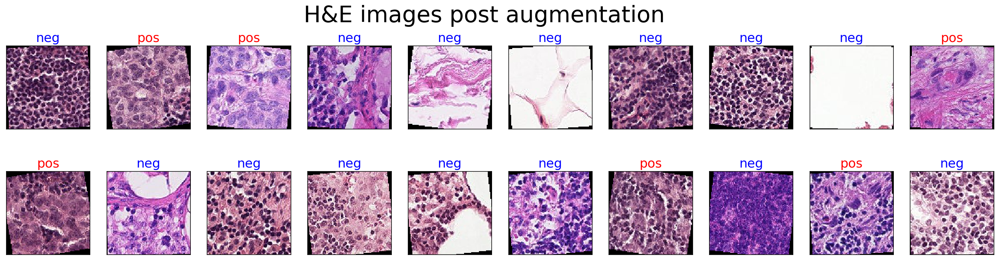

In [106]:
def imshow_transform(img):
    '''visualize images post augmentation'''
    img = img*0.5+0.5
    plt.imshow(np.transpose(img, (1,2,0)))

images, labels = next(iter(train_loader))
images = images.numpy()
classes = train_data.classes
color = ['blue', 'red']

fig = plt.figure(figsize = (25,6))
for idx in np.arange(20):
    ax = fig.add_subplot(2,10,idx+1,xticks=[], yticks=[])
    imshow_transform(images[idx])
    ax.set_title(classes[labels.numpy()[idx]], color = color[labels.numpy()[idx]], fontsize=18)
fig.suptitle('H&E images post augmentation', fontsize = 32)

## 2.2 Build CNN model

Due to the large number of training images, instead of using transfer learning to train pre-trained models directly, I built a CNN from stratch.

Here is the illustration of the CNN network:

**((ConV-ReLU)x3-MaxPool)x3 --flattening-- FC1-ReLU-FC2**

<img src="images/Image2_CNN.tif" width=600px>

`nn.Dropout` is applied following the MaxPooling layer after each stack of convolutional layers as well as the first fully-connected layer to avoid overfitting. `p` is set as `0.3`, which suggests that in each forward pass, each node will be trandomly dropped with a probability of 0.3. 

In [21]:
class Model(nn.Module):
    def __init__(self):
        super(Model,self).__init__()
        self.conv1_1 = nn.Conv2d(3,32,3,padding=1)
        self.conv1_2 = nn.Conv2d(32,32,3,padding=1)
        self.conv1_3 = nn.Conv2d(32,32,3,padding=1)

        self.conv2_1 = nn.Conv2d(32,64,3,padding=1)
        self.conv2_2 = nn.Conv2d(64,64,3,padding=1)
        self.conv2_3 = nn.Conv2d(64,64,3,padding=1)

        self.conv3_1 = nn.Conv2d(64,128,3,padding=1)
        self.conv3_2 = nn.Conv2d(128,128,3,padding=1)
        self.conv3_3 = nn.Conv2d(128,128,3,padding=1)

        self.pool = nn.MaxPool2d(2,2)
        self.fc1 = nn.Linear(128*12*12,256)
        self.fc2 = nn.Linear(256,2)
        self.dropout = nn.Dropout(0.3)

    def forward(self, x):
        x = F.relu(self.conv1_1(x))
        x = F.relu(self.conv1_2(x))
        x = F.relu(self.conv1_3(x))
        x = self.pool(x)
        x = self.dropout(x)

        x = F.relu(self.conv2_1(x))
        x = F.relu(self.conv2_2(x))
        x = F.relu(self.conv2_3(x))
        x = self.pool(x)
        x = self.dropout(x)

        x = F.relu(self.conv3_1(x))
        x = F.relu(self.conv3_2(x))
        x = F.relu(self.conv3_3(x))
        x = self.pool(x)
        x = self.dropout(x)

        x = x.view(-1,128*12*12)
        x = self.dropout(F.relu(self.fc1(x)))
        x = self.fc2(x)

        return x

## 2.3 Train CNN model

'GPU' can significantly speed up the training process compared to 'CPU'. For this project, I trained the CNN model using GPU in cluster.

In [22]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('device: {}'.format(device.type))

device: cpu


In [23]:
model = Model()
# specify loss function
criterion = nn.CrossEntropyLoss()
# specify optimizer
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In order to prevent overfitting, the following `train` function has both training and validation phases. The function trains images in the training dataset for the specified epochs (one epoch: one cycle through the full training dataset) and after each epoch, runs a full validation step. After each epoch, output of the loss function as well as the prediction accuracy is computed for both training and validation datasets, saved as `train_loss`, `train_acc`, `val_loss` and `val_acc`.

Although the training process will go through the specified number of epochs `n_epochs`, the model with the lowest `val_loss` will be saved. The reason to go through the specified epochs is to understand how the `train_loss`, `train_acc`, `val_loss` and `val_acc` values change following each epoch to help fine-tune hyperparameters to improve the training performance. In routine training jobs, the `Early Stopping` approach can be taken instead so that model training will stop when the specified evaluation metric (eg. accuracy) on the validation set decreases or doesn't improve within a certain number of epochs.

In [100]:
def train(n_epochs, train_loader, val_loader, model, criterion, optimizer, device, save_path):
    '''the train function will perform both forward and backpropagation on training and validation datasets.
    Output: trained model with the lowest val_loss and dataframe containing train_loss/train_acc and val_loss/val_acc for each epoch'''
    epoch_dict={}
    valid_loss_min = np.Inf
    model = model.to(device)
    for epoch in np.arange(n_epochs):
        # Initiate loss and accuracy values
        train_loss = 0.0
        train_acc = 0.0
        val_loss = 0.0
        val_acc = 0.0
        epoch_dict[epoch] = {}
        # Training
        model.train()
        for images, labels in train_loader:
            optimizer.zero_grad()
            images, labels = images.to(device), labels.to(device)
            output = model(images)
            loss = criterion(output, labels)
            loss.backward()
            optimizer.step()
            ## Update loss and acc values for the training process
            train_loss += loss.item()*images.shape[0]
            _, top_class = output.topk(1,dim=1)
            equals = top_class == labels.view(*top_class.shape)
            train_acc += torch.mean(equals.type(torch.FloatTensor)).item()

        # Validation
        else:
            # turn off gradients
            with torch.no_grad():
                # set model to evaluation mode
                model.eval()
                for images, labels in val_loader:
                    images, labels = images.to(device), labels.to(device)
                    output = model(images)
                    loss = criterion(output, labels)
                    ## Update loss and acc values for the validation process
                    val_loss += loss.item()*images.shape[0]
                    _, top_class = output.topk(1,dim=1)
                    equals = top_class == labels.view(*top_class.shape)
                    val_acc += torch.mean(equals.type(torch.FloatTensor)).item()

                ### write training/validation loss/accuracy
                epoch_dict[epoch]['Train_Loss'] = train_loss/len(train_loader.sampler)
                epoch_dict[epoch]['Train_Accuracy'] = train_acc/len(train_loader)
                epoch_dict[epoch]['Val_Loss'] = val_loss/len(val_loader.sampler)
                epoch_dict[epoch]['Val_Accuracy'] = val_acc/len(val_loader)

                print("Epoch: {}/{}.. ".format(epoch+1, n_epochs),
                      "Train Loss: {:.3f}.. ".format(train_loss/len(train_loader.sampler)),
                      "Train Accuracy: {:.3f}.. ".format(train_acc/len(train_loader)),
                      "Validation Loss: {:.3f}.. ".format(val_loss/len(val_loader.sampler)),
                      "Validation Accuracy: {:.3f}".format(val_acc/len(val_loader)))
                
                ## save the model with the lowest val_loss and update valid_loss_min
                if val_loss <= valid_loss_min:
                    print('Validation loss decreased -- Saving model -- \n')
                    torch.save(model.state_dict(), save_path)
                    valid_loss_min = val_loss

    epoch_df = pd.DataFrame.from_dict(epoch_dict, orient = 'index')
    epoch_df['Epoch'] = np.arange(n_epochs)+1
    return model, epoch_df

In [ ]:
n_epochs = 50
save_path = 'models/Tumor_PyTorch_model1_nobatchnorm_crop96_epoch50.pth'
model, model_df = train(n_epochs, train_loader, val_loader, model, criterion, optimizer, device, save_path)

# 3. Model evaluation

## 3.1 Visualize the loss and accuracy curves

In [108]:
epoch_df = pd.read_csv('models/Tumor_PyTorch_model1_crop96_epoch50.csv')

Text(0.5, 1.0, 'Training and Validation Accuracy')

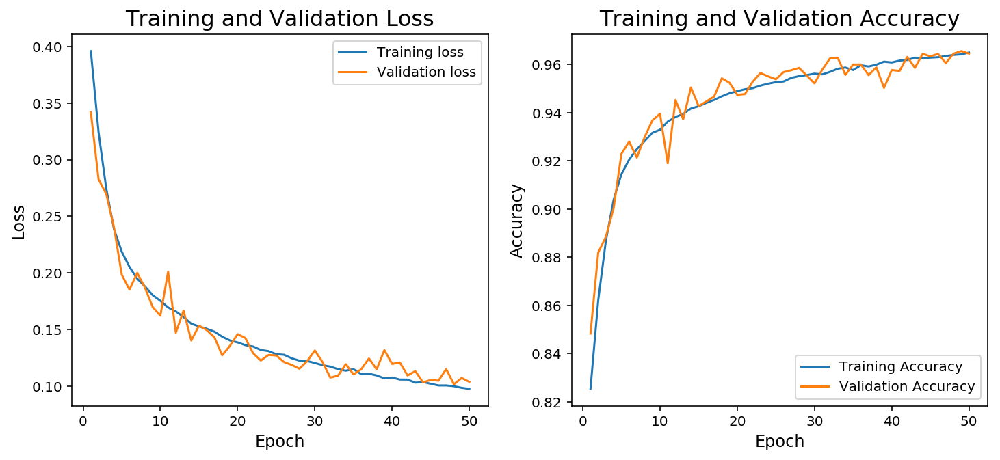

In [109]:
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(epoch_df.Epoch, epoch_df.Train_Loss, label = 'Training loss')
plt.plot(epoch_df.Epoch, epoch_df.Val_Loss, label = 'Validation loss')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.legend()
plt.title('Training and Validation Loss', fontsize=16)

plt.subplot(1,2,2)
plt.plot(epoch_df.Epoch, epoch_df.Train_Accuracy, label = 'Training Accuracy')
plt.plot(epoch_df.Epoch, epoch_df.Val_Accuracy, label = 'Validation Accuracy')
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.legend()
plt.title('Training and Validation Accuracy', fontsize=16)

## 3.2 Load the trained model

In [206]:
model = Model()
if device.type == 'cpu':
    state_dict = torch.load('models/Tumor_PyTorch_model1_crop96_epoch50.pth', map_location='cpu')
else:
    state_dict = torch.load('models/Tumor_PyTorch_model1_crop96_epoch50.pth')
model.load_state_dict(state_dict)
for param in model.parameters():
    param.requires_grad=False

## 3.3 Load images from test dataset

In addition to calculating the overall prediction accuracy of the test dataset, it's also important to know which images are classified correctly or incorrectly for future improvement and better interpretation of the classification results. 

Here, I use a modified `torchvision.datasets.ImageFolder` to load images with their path info.

reference: https://gist.github.com/andrewjong/6b02ff237533b3b2c554701fb53d5c4d

In [29]:
class ImageFolderWithPaths(datasets.ImageFolder):
    """Custom dataset that includes image file paths. Extends
    torchvision.datasets.ImageFolder
    """

    # override the __getitem__ method. this is the method dataloader calls
    def __getitem__(self, index):
        # this is what ImageFolder normally returns 
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        # the image file path
        path = self.imgs[index][0]
        # make a new tuple that includes original and the path
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path

In [205]:
test_path = test_dir2
## No augmentation
test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])
test_data = ImageFolderWithPaths(test_path, transform = test_transforms)
test_loader = torch.utils.data.DataLoader(test_data, batch_size = BATCH_SIZE, shuffle = True)

## 3.4 Compute prediction results

In [76]:
def model_eval(test_loader, model, criterion, device, classes):
    '''Apply the trained model to testing dataset and summarize the overall test_loss/test_acc
    also output testing accuracy for each category and the prediction result for each sample as well as the probability'''
    # Initiate loss and accuracy values
    test_loss = 0.0
    test_acc = 0.0
    class_correct = list(0. for i in range(len(classes)))
    class_total = list(0. for i in range(len(classes)))
  
    dt = np.dtype(int)
    true_label = np.array([], dtype = dt)
    pred_label = np.array([], dtype = dt)
    path_array = np.array([])
    prob_array = np.array([])
    probs_array = np.array(classes).reshape(1,-1)
    
    model = model.to(device)
    with torch.no_grad():
        model.eval()
        for images, labels, paths in test_loader:
            path_array = np.append(path_array, np.array(paths))
            images, labels = images.to(device), labels.to(device)
            output = model(images)
            loss = criterion(output, labels)
            test_loss += loss.item()*images.shape[0]
        
            softmax = nn.Softmax(dim=1)
            output_softmax = softmax(output)
            top_probs, preds = output_softmax.topk(1,dim=1)
            equals = preds == labels.view(*preds.shape)
            correct = np.squeeze(equals)
            test_acc += torch.mean(equals.type(torch.FloatTensor)).item()
            for i in range(len(images)):
                label = labels[i].item()
                class_correct[label] += correct[i].item()
                class_total[label] += 1
    
            if device.type == 'cpu':
                true_label = np.append(true_label, labels)
                pred_label = np.append(pred_label, preds)
                prob_array = np.append(prob_array, top_probs)
                probs_array = np.concatenate((probs_array, output_softmax))
      
            else:
                true_label = np.append(true_label, labels.cpu())
                pred_label = np.append(pred_label, preds.cpu())
                prob_array = np.append(prob_array, top_probs.cpu())
                probs_array = np.concatenate((probs_array, output_softmax.cpu()))
            
      
    test_loss = test_loss/len(test_loader.sampler)
    test_acc = test_acc/len(test_loader)
    print('Test Loss: {:.6f}\n'.format(test_loss))
    print('Test Accuracy (Overall): {:.3f}%  ({}/{})\n'.format(np.sum(class_correct)/np.sum(class_total)*100, np.sum(class_correct), np.sum(class_total)))
  
    for i in range(len(classes)):
        if class_total[i] > 0:
            print('Test Accuracy of {}: {:.3f}% ({}/{})'.format(classes[i], class_correct[i]/class_total[i]*100,class_correct[i], class_total[i]))
        else:
            print('Test Accuracy of {}: N/A'.format(classes[i]))
    summary_df = pd.DataFrame({'category': classes, 'correct': class_correct, 'total': class_total})
    pred_df = pd.DataFrame({'file_path': path_array, 'true_label': true_label, 'prediction': pred_label, 'prob': prob_array})
    probs_df = pd.DataFrame(probs_array[1:], columns = probs_array[0])
    probs_df['file_path'] = path_array
    pred_df = pred_df.merge(probs_df, left_on = 'file_path', right_on = 'file_path')
    return summary_df, pred_df

In [77]:
criterion = nn.CrossEntropyLoss()
classes = test_data.classes
summary_df, pred_df = model_eval(test_loader, model, criterion, device, classes)

Test Loss: 0.082972

Test Accuracy (Overall): 97.399%  (21418.0/21990.0)

Test Accuracy of neg: 97.637% (12770.0/13079.0)
Test Accuracy of pos: 97.049% (8648.0/8911.0)


In [12]:
# summary_df.to_csv('models/Tumor_PyTorch_model1_crop96_epoch50_summary_df.csv', index = False)
# pred_df.to_csv('models/Tumor_PyTorch_model1_crop96_epoch50_pred_df.csv', index = False)
summary_df = pd.read_csv('models/Tumor_PyTorch_model1_crop96_epoch50_summary_df.csv')
pred_df = pd.read_csv('models/Tumor_PyTorch_model1_crop96_epoch50_pred_df.csv')

## 3.5 Evaluate model performance

This is a binary classification project and the dataset is not perfectly balanced (59.50%/40.50%). Depending on the real context, sometomes accuracy is not the best evaluation metric to assess the model performance. Alternative metrics include:
* **Precision**: True Positives / (True Positives + False Positives)

* **Recall (sensitivity)**: True Positives / (True Positives + False Negatives)

* **F1**: 2 * (precision * recall) / (precision + recall)
* **ROC** (described later)

Precision describes how good a model is at predicting the positive class. Recall describes how good the model is at predicting the positive class when the actual outcome is positive. The goal is to try to improve both precision and recall scores. However, there is often an inverse relationship between these two metrics that one score increases at the cost of reducing the other. 

F1 score is a weighted average of the precision and recall to provide a single measurement for a system. F1 score is in the range of [0,1] and a higher F1 score means better model performance.

### 3.5.1 Confusion matrix

In [14]:
cm = confusion_matrix(pred_df.true_label, pred_df.prediction)

In [15]:
def plot_confusion_matrix(cm, classes,title='Confusion matrix',cmap=plt.cm.Blues):    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=12)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, '{:d} \n({:.2f}%)'.format(cm[i, j], cm[i,j]/cm.sum()*100), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

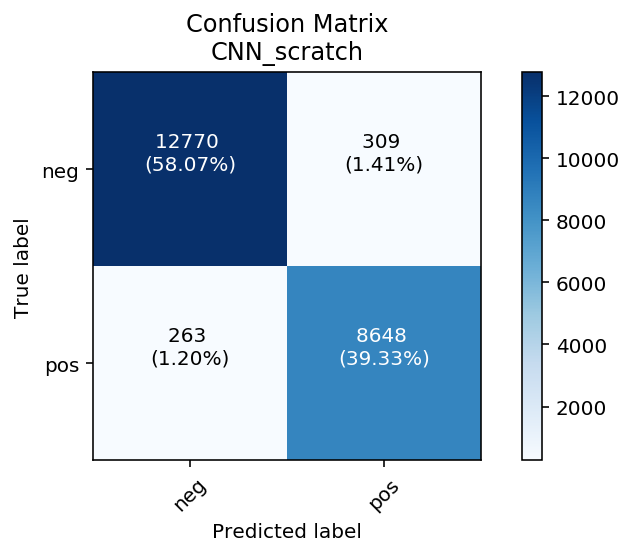

In [18]:
plot_confusion_matrix(cm, classes, title = 'Confusion Matrix\nCNN_scratch')

### 3.5.2 Compute precision, recall, F1 scores

In [83]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
precision = precision_score(pred_df.true_label, pred_df.prediction)
recall = recall_score(pred_df.true_label, pred_df.prediction)
f1 = f1_score(pred_df.true_label, pred_df.prediction)
print('precision: {:.3f}'.format(precision))
print('recall: {:.3f}'.format(recall))
print('f1 score: {:.3f}'.format(f1))

precision: 0.966
recall: 0.970
f1 score: 0.968


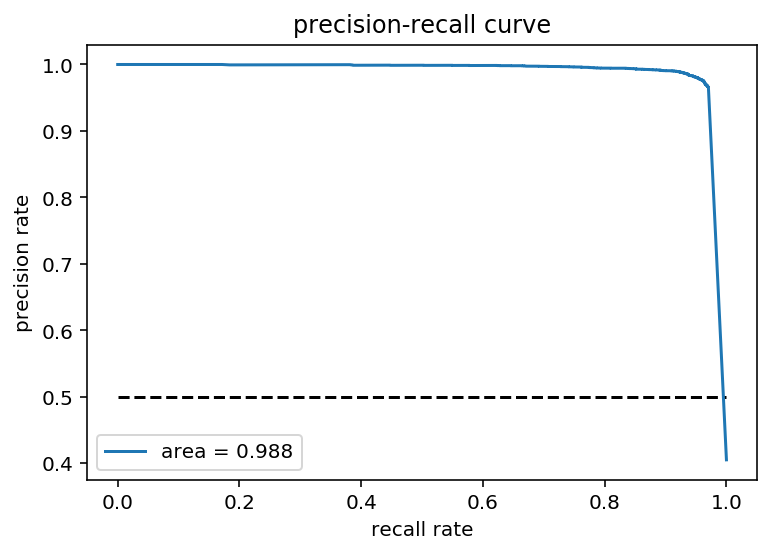

In [84]:
precision, recall, thresholds = precision_recall_curve(pred_df.true_label, pred_df.prob*pred_df.prediction)
# calculate precision-recall AUC
auc_score = auc(recall, precision)

plt.figure(1)
plt.plot([0, 1], [0.5, 0.5], 'k--')
plt.plot(recall, precision, label='area = {:.3f}'.format(auc_score))
plt.xlabel('recall rate')
plt.ylabel('precision rate')
plt.title('precision-recall curve')
plt.legend(loc='best')
plt.show()

### 3.5.3 ROC

**ROC** (Receiver Operating Characteristic) curve is a plot of TPR versus FPR for a number of different threshold values between 0.0 and 1.0.

**TPR** (Recall): True Positive Rate = True Positives / (True Positives + False Negatives)

**FPR**: False Positive Rate = False Positives / (False Positives + True Negatives)

FPR describes how often a positive class is predicted when the actual outcome is negative

**AUC**: area under the ROC curve, as a measure of aggregated classification performance

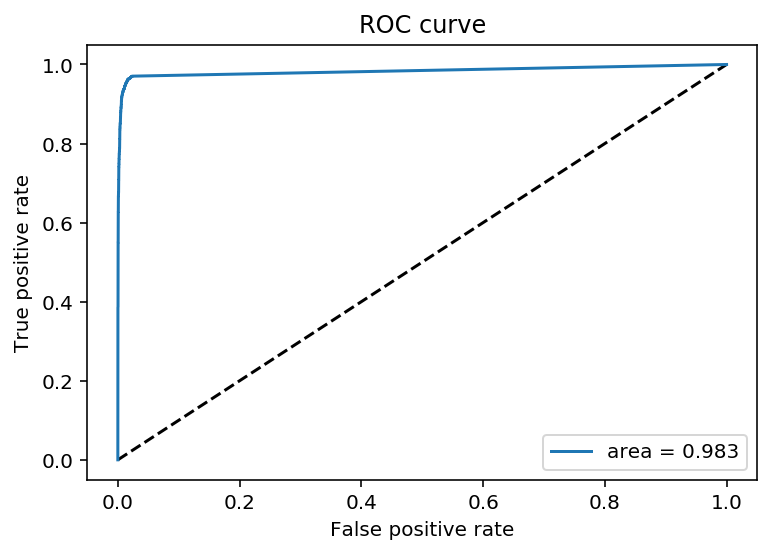

In [85]:
from sklearn.metrics import roc_curve, auc
## probs: probabilities for class 1 only
fpr, tpr, thresholds = roc_curve(pred_df.true_label, pred_df.prob*pred_df.prediction)
auc_value = auc(fpr, tpr)

plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='area = {:.3f}'.format(auc_value))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()

## 3.6 Visualize images and the classification result

In [86]:
pred_df = pd.read_csv('models/Tumor_PyTorch_model1_crop96_epoch50_pred_df.csv', index_col = 'file_path')

In [87]:
pred_true_pos = pred_df[(pred_df.true_label == 1) & (pred_df.prediction == 1)]   ## 8648
pred_true_neg = pred_df[(pred_df.true_label == 0) & (pred_df.prediction == 0)]   ## 12770
pred_false_pos = pred_df[(pred_df.true_label == 0) & (pred_df.prediction == 1)]   ## 309
pred_false_neg = pred_df[(pred_df.true_label == 1) & (pred_df.prediction == 0)]   ## 263

Text(0.5, 0.98, 'False negative images (label:pos/pred:neg)')

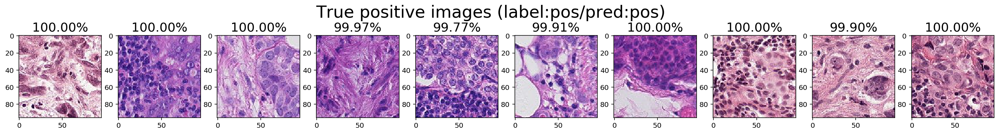

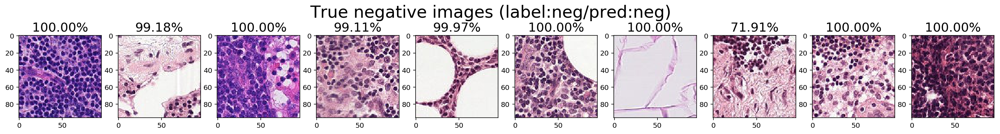

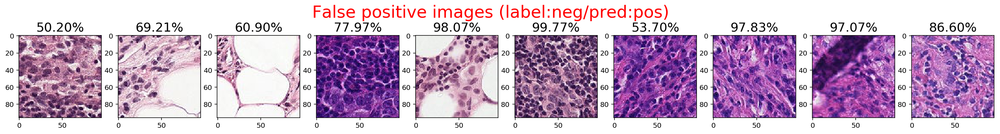

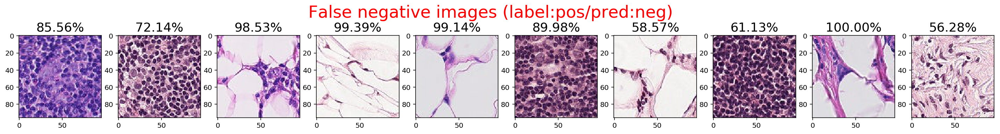

In [99]:
fig = plt.figure(figsize=(25,3))
for i,img_path in enumerate(np.random.choice(pred_true_pos.index, 10)):
    ax = fig.add_subplot(1,10,i+1)
    ax.imshow(readImage_rgb(img_path))
    prob = pred_df.loc[img_path,].prob
    ax.set_title('{:.2f}%'.format(prob*100), fontsize=18)
fig.suptitle('True positive images (label:pos/pred:pos)', fontsize = 24)

fig = plt.figure(figsize=(25,3))
for i,img_path in enumerate(np.random.choice(pred_true_neg.index, 10)):
    ax = fig.add_subplot(1,10,i+1)
    ax.imshow(readImage_rgb(img_path))
    prob = pred_df.loc[img_path,].prob
    ax.set_title('{:.2f}%'.format(prob*100), fontsize=18)
fig.suptitle('True negative images (label:neg/pred:neg)', fontsize = 24)

fig = plt.figure(figsize=(25,3))
for i,img_path in enumerate(np.random.choice(pred_false_pos.index, 10)):
    ax = fig.add_subplot(1,10,i+1)
    ax.imshow(readImage_rgb(img_path))
    prob = pred_df.loc[img_path,].prob
    ax.set_title('{:.2f}%'.format(prob*100), fontsize=18)
fig.suptitle('False positive images (label:neg/pred:pos)', fontsize = 24, color = 'red')

fig = plt.figure(figsize=(25,3))
for i,img_path in enumerate(np.random.choice(pred_false_neg.index, 10)):
    ax = fig.add_subplot(1,10,i+1)
    ax.imshow(readImage_rgb(img_path))
    prob = pred_df.loc[img_path,].prob
    ax.set_title('{:.2f}%'.format(prob*100), fontsize=18)
fig.suptitle('False negative images (label:pos/pred:neg)', fontsize = 24, color = 'red')

# 4. CNN visualization

## 4.1 t-SNE plots to view features extracted by CNN

In [24]:
def feature_extraction(test_loader, model, device, classes, n_feature):
    dt = np.dtype(int)
    true_label = np.array([], dtype = dt)
    path_array = np.array([])
    feature_array = np.array(['idx'+str(i)for i in np.arange(n_feature)]).reshape(1,n_feature)
  
    model = model.to(device)
    with torch.no_grad():
        model.eval()
        for images, labels, paths in test_loader:
            path_array = np.append(path_array, np.array(paths))
            images, labels = images.to(device), labels.to(device)
            output = model(images)
            
            if device.type == 'cpu':
                true_label = np.append(true_label, labels)
                feature_array = np.concatenate((feature_array, output))
      
            else:
                true_label = np.append(true_label, labels.cpu())
                feature_array = np.concatenate((feature_array, output.cpu()))
                
    feature_df = pd.DataFrame(feature_array[1:], columns = feature_array[0], index = path_array)
    feature_df['label'] = true_label
    return feature_df

In [25]:
model_fe = Model()
if device.type == 'cpu':
    state_dict = torch.load('models/Tumor_PyTorch_model1_crop96_epoch50.pth', map_location='cpu')
else:
    state_dict = torch.load('models/Tumor_PyTorch_model1_crop96_epoch50.pth')
model_fe.load_state_dict(state_dict)
for param in model_fe.parameters():
    param.requires_grad=False

In [26]:
model_fe.fc2 = nn.Sequential()

In [32]:
img_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])

train_data = ImageFolderWithPaths(train_path, transform = img_transforms)
train_loader = torch.utils.data.DataLoader(train_data, batch_size = BATCH_SIZE, shuffle = True)

test_data = ImageFolderWithPaths(test_path, transform = img_transforms)
test_loader = torch.utils.data.DataLoader(test_data, batch_size = BATCH_SIZE, shuffle = True)

In [129]:
# model_fe_feature_train_df = feature_extraction(train_loader, model_fe, device, classes, 256)
model_fe_feature_test_df = feature_extraction(test_loader, model_fe, device, classes, 256)

In [103]:
# model_fe_feature_train_df.to_csv('models/Tumor_PyTorch_model1_crop96_epoch50_feature_train_df.csv', index = False)
model_fe_feature_test_df.to_csv('models/Tumor_PyTorch_model1_crop96_epoch50_feature_test_df.csv', index = False)
# model_fe_feature_test_df = pd.read_csv('models/Tumor_PyTorch_model1_crop96_epoch50_feature_test_df.csv')

In [104]:
def feature_tsne_plot(feature_df, classes, title='t-SNE plot'):
    label_to_id_dict = {v:i for i,v in enumerate(classes)}
    id_to_label_dict = {v: k for k, v in label_to_id_dict.items()}
    feature_df['class_label'] = feature_df.label.map(id_to_label_dict)
    data = feature_df.iloc[:,:-2]
    data = np.reshape(data, (data.shape[0], -1)).astype(np.float64)
    data_2d = bh_sne(data)
    df_subset = pd.DataFrame({'tsne-2d-one':data_2d[:,0], 'tsne-2d-two':data_2d[:,1], 'target':feature_df.class_label})
    plt.figure(figsize=(8,8))
    tsne = sns.scatterplot(
        x="tsne-2d-one", y="tsne-2d-two",
        hue="target",
        hue_order=classes,
        palette=['#99bbff','#ff9999'],
        data=df_subset,
        legend="full",
        alpha=1)
    plt.title(title, fontsize=16)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show(tsne)

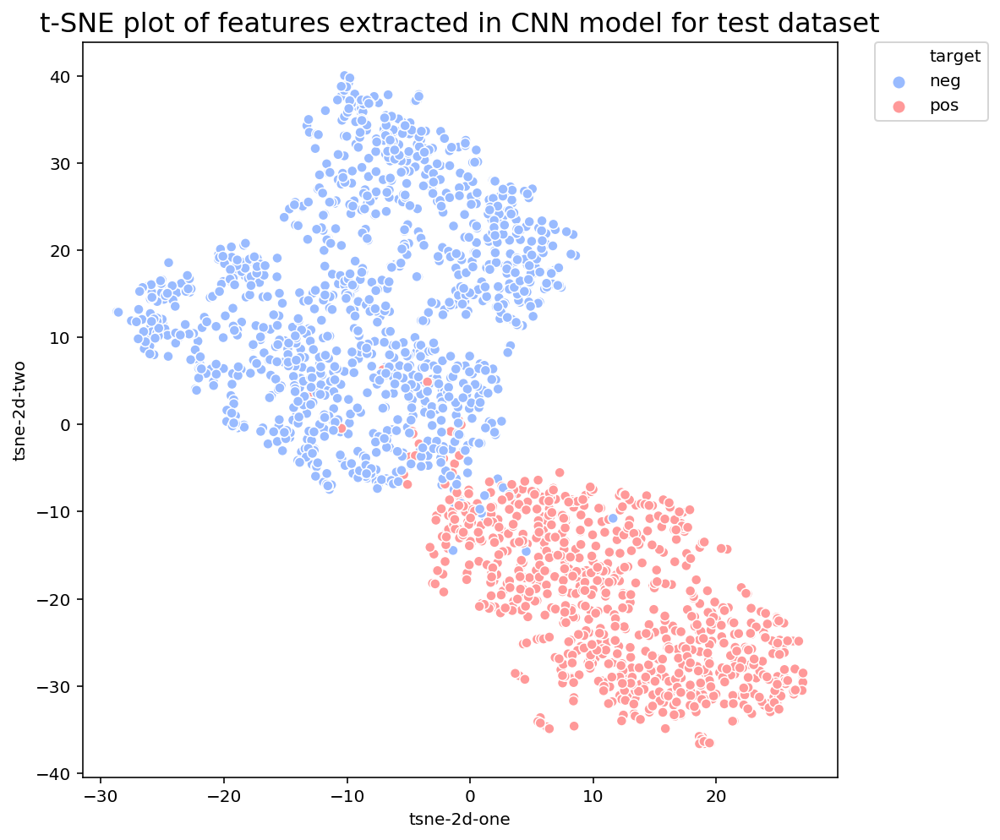

In [105]:
# feature_tsne_plot(shuffle(inception_fc2_feature_train_df), classes, title = 't-SNE plot of features extracted in Inception_v3 (fc2) for train_val dataset')
feature_tsne_plot(shuffle(model_fe_feature_test_df).iloc[:2000,:], classes, title = 't-SNE plot of features extracted in CNN model for test dataset')

As we can see from the t-SNE plot of features extracted by the trained CNN model of 2000 images randomly selected from the test dataset, now there is a clear separation between the `neg` and `pos` classes after feature extraction. 

## 4.2 View output of the CNN layers

In [33]:
def im_convert(tensor):
    """ Display a tensor as an image. """
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.5, 0.5, 0.5)) + np.array((0.5, 0.5, 0.5))
    image = image.clip(0, 1)

    return image

Text(0.5, 1.0, 'Raw H&E image')

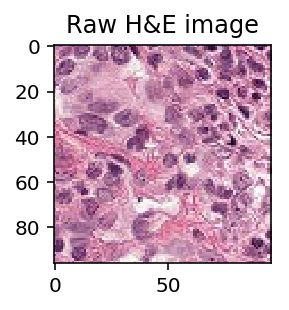

In [74]:
#images, labels, paths = next(iter(train_loader))
img = images[0].unsqueeze(0)
plt.figure(figsize=(2,2))
plt.imshow(im_convert(img))
plt.title('Raw H&E image')

In [76]:
def viz_layer(layer, n_filters= 32, title = 'output of CNN'):
    fig = plt.figure(figsize=(20, n_filters/3.2))
    
    for i in range(n_filters):
        ax = fig.add_subplot(n_filters/8, 8, i+1, xticks=[], yticks=[])
        # grab layer outputs
        ax.imshow(np.squeeze(layer[0,i].data.numpy()), cmap = 'gray')
        ax.set_title('Output %s' % str(i+1), fontsize=18)
    plt.tight_layout()
    fig.suptitle(title, fontsize=32, y=1.08)

In [77]:
cnn_layers = list(model_fe._modules.keys())
print(cnn_layers)

['conv1_1', 'conv1_2', 'conv1_3', 'conv2_1', 'conv2_2', 'conv2_3', 'conv3_1', 'conv3_2', 'conv3_3', 'pool', 'fc1', 'fc2', 'dropout']


Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


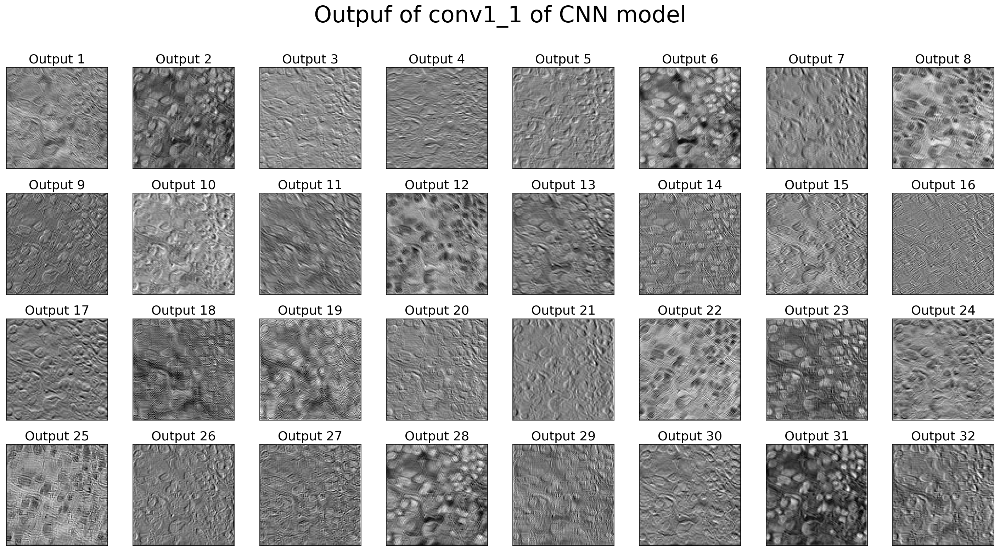

In [78]:
layer1 = model_fe._modules[cnn_layers[0]]
print(layer1)
img_layer1 = layer1(img)
viz_layer(img_layer1, n_filters=32, title = 'Outpuf of {} of CNN model'.format(cnn_layers[0]))

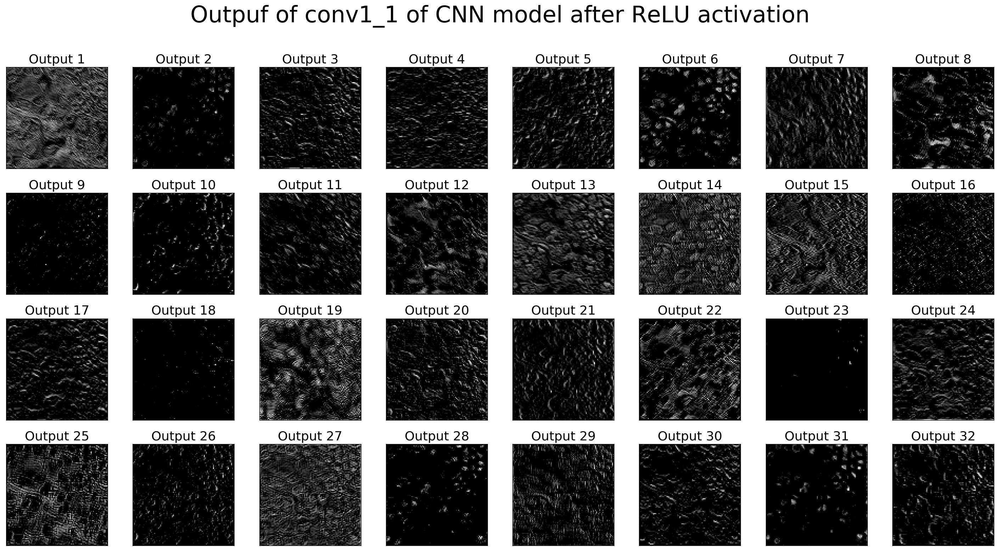

In [79]:
viz_layer(F.relu(img_layer1), n_filters=32, title = 'Outpuf of {} of CNN model after ReLU activation'.format(cnn_layers[0]))

Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


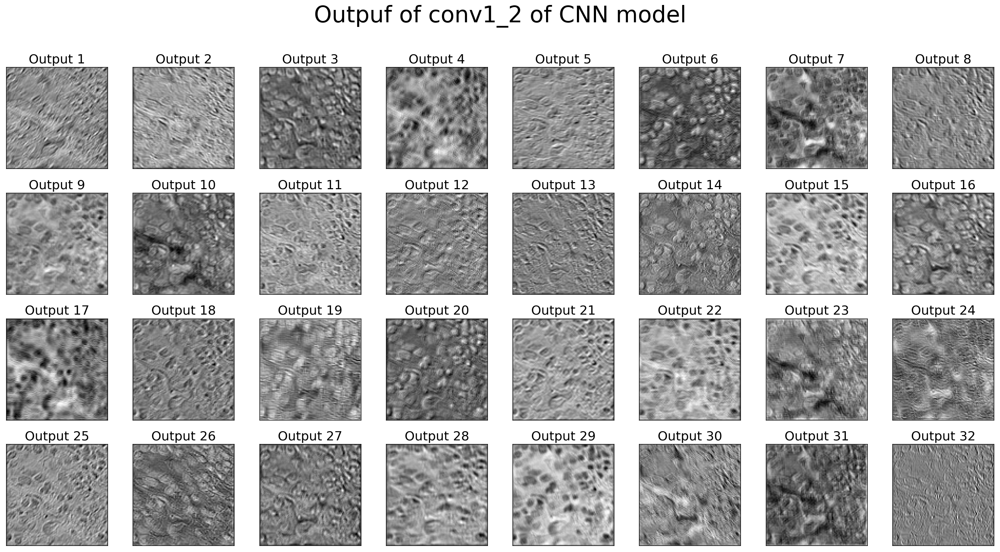

In [80]:
layer2 = model_fe._modules[cnn_layers[1]]
print(layer2)
img_layer2 = layer2(layer1(img))
viz_layer(img_layer2, n_filters=32, title = 'Outpuf of {} of CNN model'.format(cnn_layers[1]))

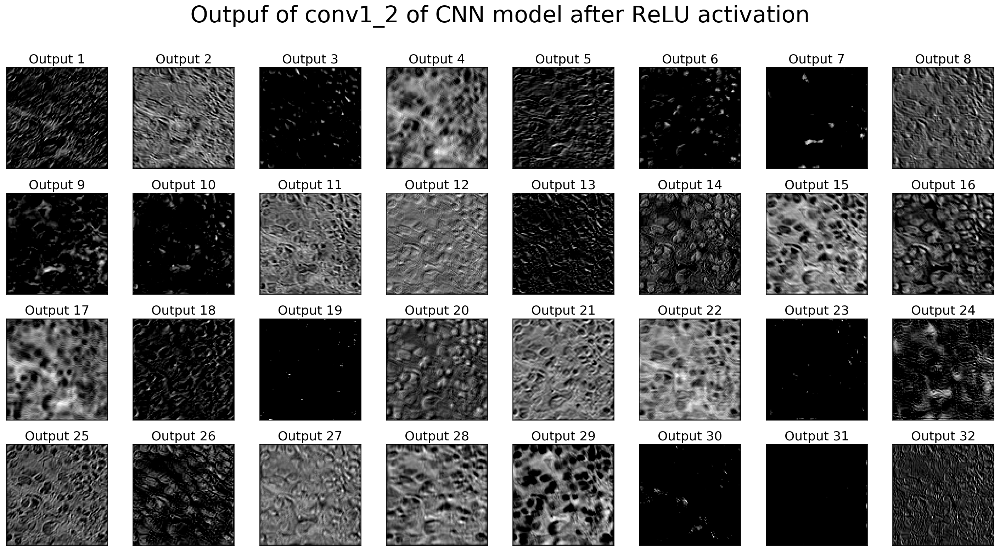

In [81]:
viz_layer(F.relu(img_layer2), n_filters=32, title = 'Outpuf of {} of CNN model after ReLU activation'.format(cnn_layers[1]))

Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))


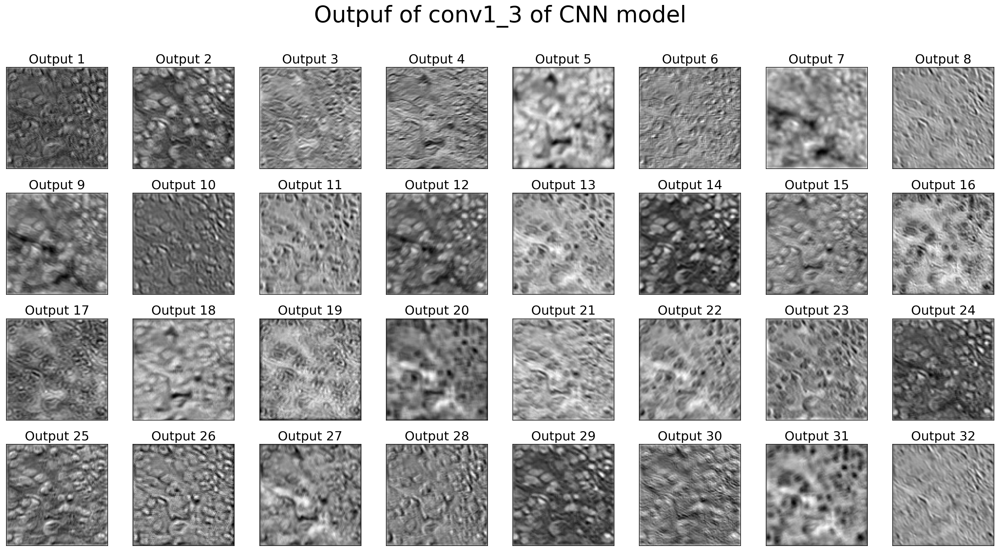

In [82]:
layer3 = model_fe._modules[cnn_layers[2]]
print(layer2)
img_layer3 = layer3(layer2(layer1(img)))
viz_layer(img_layer3, n_filters=32, title = 'Outpuf of {} of CNN model'.format(cnn_layers[2]))

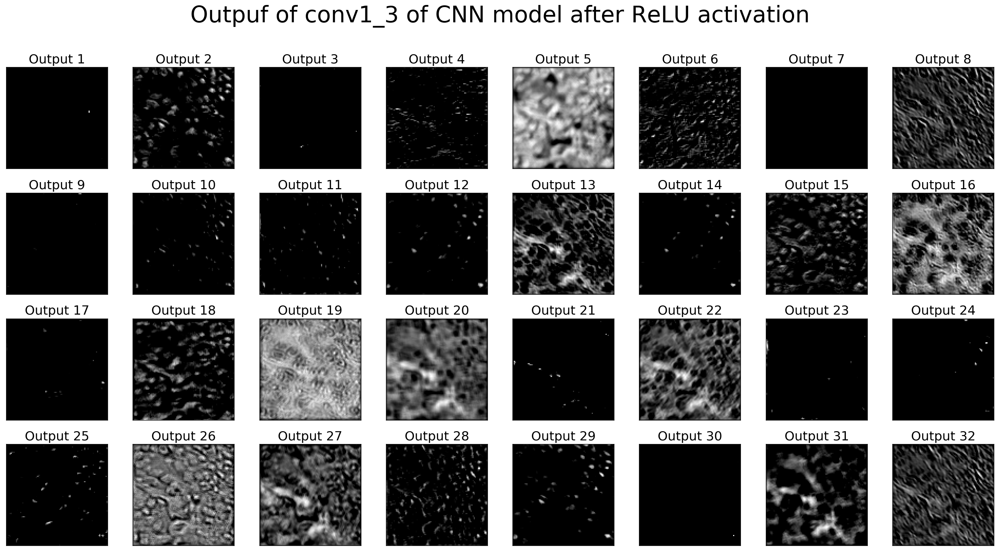

In [83]:
viz_layer(F.relu(img_layer3), n_filters=32, title = 'Outpuf of {} of CNN model after ReLU activation'.format(cnn_layers[2]))

#### Output of the first stack of convolutional layers conv1 (conv1_1 - conv1_2 - conv1_3 - maxpool)

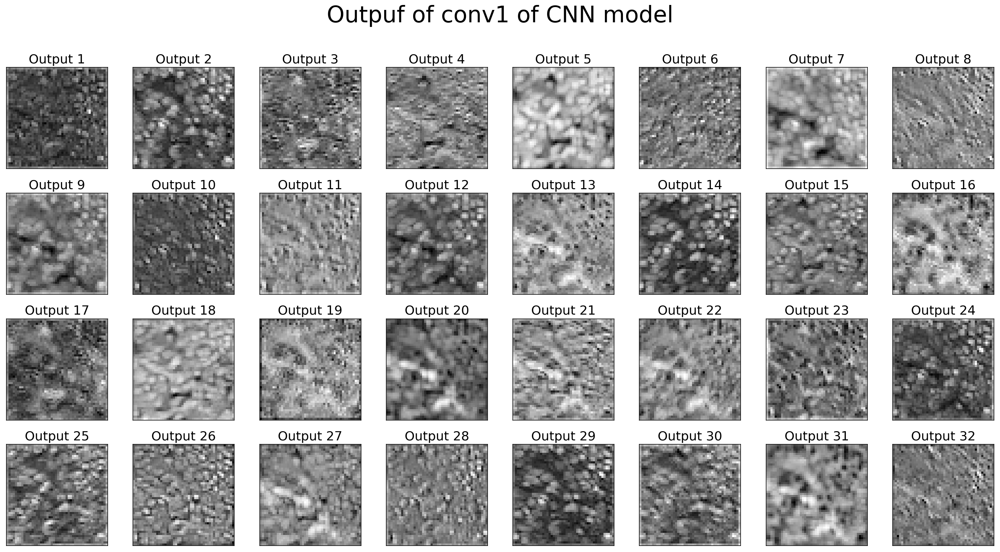

In [84]:
max_pool = model_fe._modules[cnn_layers[9]]
# dropout = model_fe._modules[cnn_layers[12]]
img_conv1_output = max_pool(img_layer3)
viz_layer(img_conv1_output, n_filters=32, title = 'Outpuf of {} of CNN model'.format('conv1'))

#### Output of the second stack of convolutional layers conv2 (conv2_1 - conv2_2 - conv2_3 - maxpool)

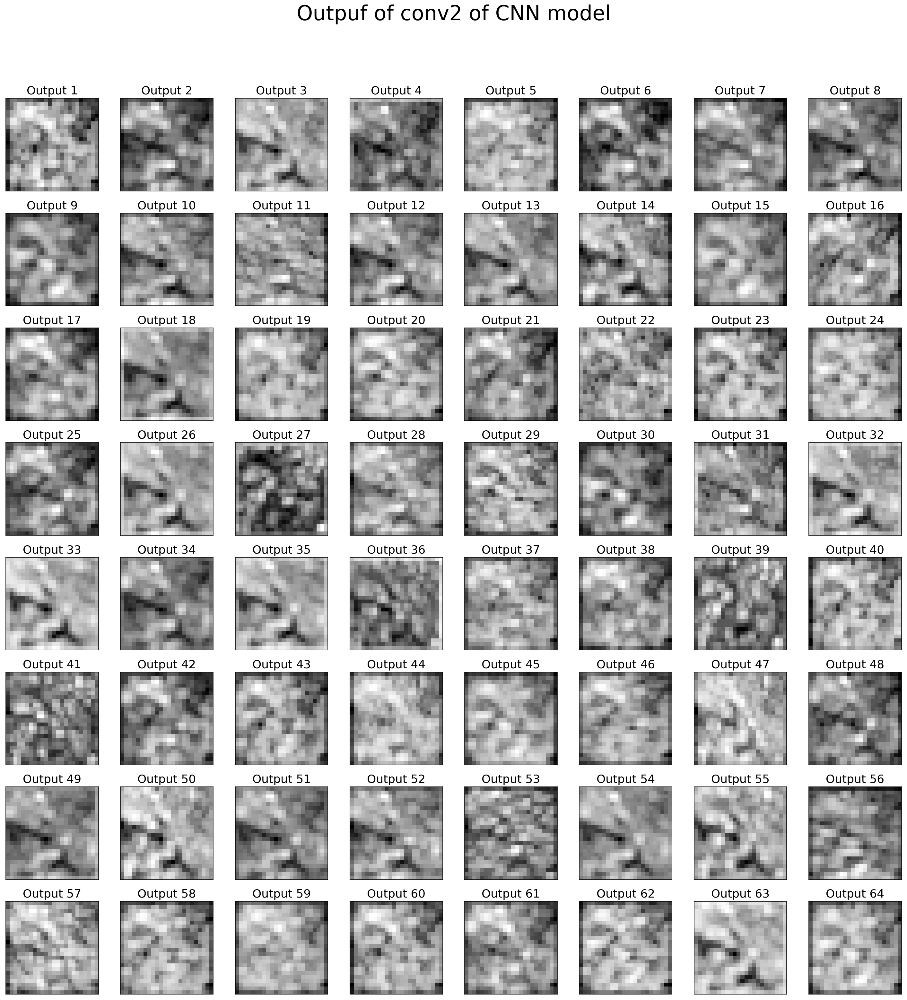

In [85]:
layer4 = model_fe._modules[cnn_layers[3]]
layer5 = model_fe._modules[cnn_layers[4]]
layer6 = model_fe._modules[cnn_layers[5]]
img_conv2_output = max_pool(layer6(layer5(layer4(img_conv1_output))))
viz_layer(img_conv2_output, n_filters=64, title = 'Outpuf of {} of CNN model'.format('conv2'))

#### Output of the third stack of convolutional layers conv3 (conv3_1 - conv3_2 - conv3_3 - maxpool)

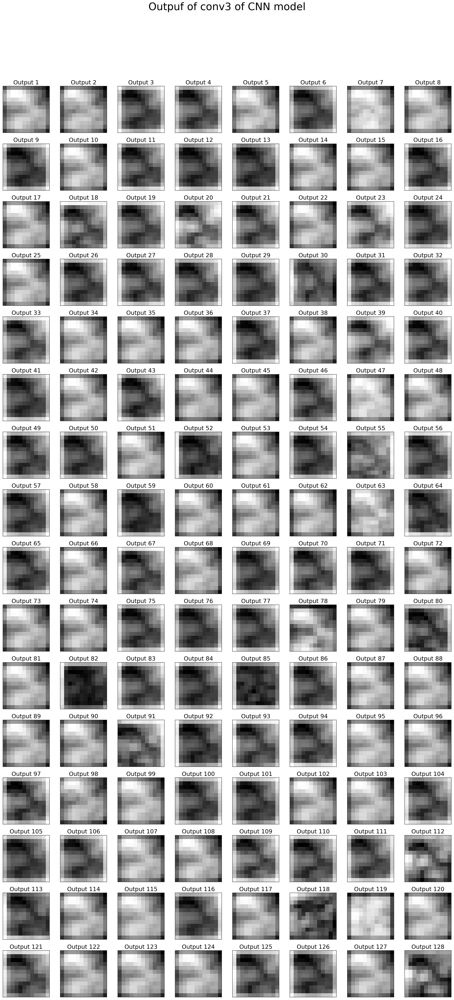

In [86]:
layer7 = model_fe._modules[cnn_layers[6]]
layer8 = model_fe._modules[cnn_layers[7]]
layer9 = model_fe._modules[cnn_layers[8]]
img_conv3_output = max_pool(layer9(layer8(layer7(img_conv2_output))))
viz_layer(img_conv3_output, n_filters=128, title = 'Outpuf of {} of CNN model'.format('conv3'))

As we can see from the output of `conv1_1`, `conv1_2`, and `conv1_3` as well as post activation images, the first few convolutional layers can capture basic 'content' features of images such as shape, edge, and boundaries.

Deeper convolutional layers tend to capture higher-order features such as colors and textures. It's visually obvious that output from the deeper layers (eg. `conv3`) contains very 'abstract' info that can hardly be inferred from the original input image. In contrast, features captured by the first stack of convolutional layers (`conv1`: `conv1_1`, `conv1_2`, `conv1_3`) mainly contain information about object and shape arrangement that can easily be inferred from the original image.

# 5. Prediction

In [207]:
## https://discuss.pytorch.org/t/load-my-own-test-data-images/30009
from torch.utils.data import Dataset
class TestDataset(Dataset):
    def __init__(self, path, transform=None):
        self.image_paths = glob(os.path.join(test_path, '*.tif'))
        self.transform = transform

    def __getitem__(self, index):
        x = Image.open(self.image_paths[index])
        if self.transform is not None:
            x = self.transform(x)
        path = self.image_paths[index]

        return x, path

    def __len__(self):
        return len(self.image_paths)

In [208]:
test_path = '/Volumes/Yuchen_Drive/Histopathologic_Cancer_Detection/test'
test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
])
test_data = TestDataset(test_path, transform = test_transforms)
test_loader = torch.utils.data.DataLoader(test_data, batch_size = BATCH_SIZE)

In [216]:
def prediction(test_loader, model, criterion, device, classes):
    '''Test trained model on testing set and summarize the overal test_loss/test_acc
    output testing accuracy for each category and the prediction result for each datapoint as well as the probability'''
    # Initiate loss and accuracy values
    
    dt = np.dtype(int)
    pred_label = np.array([], dtype = dt)
    path_array = np.array([])
    prob_array = np.array([])
  
    model = model.to(device)
    with torch.no_grad():
        model.eval()
        for images, paths in test_loader:
            path_array = np.append(path_array, np.array(paths))
            images = images.to(device)
            output = model(images)
        
            softmax = nn.Softmax(dim=1)
            output_softmax = softmax(output)
            probs, preds = output_softmax.topk(1,dim=1)
            
            if device.type == 'cpu':
                pred_label = np.append(pred_label, preds)
                prob_array = np.append(prob_array, probs)
      
            else:
                pred_label = np.append(pred_label, preds.cpu())
                prob_array = np.append(prob_array, probs.cpu())
            
    print('Images predicted (Overall): {}'.format(len(pred_label)))
    
    pred_df = pd.DataFrame({'file_path': path_array, 'prediction': pred_label, 'prob': prob_array})
    return pred_df 

In [217]:
pred_df = prediction(test_loader, model, criterion, device, classes)

Images predicted (Overall): 57458


In [218]:
pred_df.head()

,file_path,prediction,prob
0,/Volumes/Yuchen_Drive/Histopathologic_Cancer_D...,1,0.999999
1,/Volumes/Yuchen_Drive/Histopathologic_Cancer_D...,1,0.775750
2,/Volumes/Yuchen_Drive/Histopathologic_Cancer_D...,1,0.999876
3,/Volumes/Yuchen_Drive/Histopathologic_Cancer_D...,0,1.000000
4,/Volumes/Yuchen_Drive/Histopathologic_Cancer_D...,0,0.999929


In [219]:
pred_df.to_csv('pred_df_1.csv')

In [220]:
pred_df['img_id'] = pred_df['file_path'].apply(lambda x: x[60:].split('.')[0])
pred_df['label_prob'] = pred_df.prediction*pred_df.prob + (1-pred_df.prediction)*(1-pred_df.prob)

In [221]:
submission = pd.read_csv('/Users/xiey1/Documents/AI/Histopathologic_Cancer_Detection/sample_submission.csv')

In [223]:
sub_df = pd.merge(submission, pred_df, left_on = 'id', right_on = 'img_id').loc[:,['id', 'label_prob']]
sub_df.rename(columns = {'label_prob': 'label'}, inplace = True)
#sub_df.head()

In [224]:
sub_df.to_csv('submission_pred_df.csv', index = False)

# 6. Conclusion and discussion

**Conclusion**: Using a 14-layer convolutional neural network built from scratch and trained on 175,917 images can achieve:
   * Overall prediction accuracy: 0.974
   * Precision: 0.966
   * Recall: 0.970
   * F1 score: 0.968
   * ROC_AUC: 0.983

1.I used a 14-layer CNN model built from scratch (((ConV-ReLU)x3-MaxPool)x3 --flattening-- FC1-ReLU-FC2) to train images in the training dataset and chose the model with the lowest loss score based on the validation dataset.

2.The class ratio is around 60%/40% between neg/pos classes in the training dataset. Although the class ratio doesn't equal 50%/50%, it will not lead to significant bias such that one class has a particular high prediction accuracy while the other not. The prediction accuracy is comparable between `neg` and `pos` classes and the precision and recall scores are also close to each other. For binary classification problems, it's important to keep a balanced ratio between the two classes to achieve optimal prediction accuracy.

3.Based on project description, 'a positive label indicates that the center 32x32px region of a patch contains at least one pixel of tumor tissue'. However, it's possible that regions surrounding the tumor area can have specific patterns and thus also contain information that can help with classification. I also tried to crop the image to different sizes and noticed that images without cropping have the highest prediction accuracy.

4.Based on literature, lower-order statistics of images such as the mean and variance of image pixel intensity can be used to describe texture and help with classification. I computed and plotted the distribution of average pixel intensity of each image, distribution of standard deviation of pixel intensity of each image, and the overall pixel distribution for images from both classes. It's obvious based on density plots that the pixel values have distinct distribution patterns between `neg` and `pos` classes. In addition, statistics such as the mean value, maximum pixel and minimum pixel can help filter images with bad quality (eg. overexposure or udnerexposure). These images can provide minimal information and will unlikely be used for classification in real application, and thus need to be removed from the datasets before training the model. It's always important to run a simple quality check for each image in the dataset before moving forward with further analysis or training process. 

5.This project focuses on identifying metastatic tumor cells in histopathologic scans of lymph node sections, which has widespread medical applications and can particularly help with cancer diagnosis and prognosis. The appearance of tumor cells in lymph node is an important sign of distant metastasis and can significantly decrease survival. However, the early detection of tumor micrometastasis is always challenging due to the uncertainty of where the tumor cells may reside and can easily lead to false negatives. The development of automated medical image classification approach can significantly speed up the diagnosis process and increase accuracy.